# Install Packages

In [ ]:
# !pip install --force-reinstall numpy==1.26.4

In [ ]:
!pip install mogptk diffrax pykoopman pydmd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.0/35.0 MB 29.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.5/136.5 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.2/193.2 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.7/95.7 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.1/177.1 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.3/55.3 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 80.2 MB/s eta 0:00:00
   

# Import Libraries

In [ ]:
# System Packages
import os
import time

# Data manipulation
import numpy as np
import pandas as pd

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# For Bayesian Inference
import arviz as az
import pymc as pm
import pytensor
import pytensor.tensor as pt
from numba import njit
from pymc.ode import DifferentialEquation
from pytensor.compile.ops import as_op
from scipy.integrate import odeint, solve_ivp
from scipy.optimize import least_squares
from scipy.signal import detrend, savgol_filter

# MOGPTK
import torch
import mogptk

# NCDE
import diffrax
import equinox as eqx  # https://github.com/patrick-kidger/equinox
import jax
import jax.nn as jnn
import jax.numpy as jnp
import jax.random as jr
import jax.scipy as jsp
import optax  # https://github.com/deepmind/optax

# PyKoopman
import pykoopman as pk
from pydmd import DMD

# Performance metrics
from sklearn.metrics import r2_score

THEANO_FLAGS = "optimizer=fast_compile"

print(f"PyMC3 Version: {pm.__version__}")
print(f"NumPy Version: {np.__version__}")
print(f"PyTensor Version: {pytensor.__version__}")

PyMC3 Version: 5.21.2
NumPy Version: 1.26.0
PyTensor Version: 2.30.3


# Import Tempo Mouse Aorta Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
thesis_path = "/content/drive/MyDrive/Grad_Stuff/Masters/Research Thesis/"
plots_path = os.path.join(thesis_path, "plots/")
data_path = os.path.join(thesis_path, "data/")
tempo_path = os.path.join(data_path, "tempo/")

tempo_df = pd.read_csv(os.path.join(tempo_path, "tempo_data.csv"))
tempo_df = tempo_df.rename(columns={'Time (hours)':'time'})

tempo_df = tempo_df.iloc[:, 1:] # remove unnamed: 0 field

tempo_df.head()

,time,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,0.000000,-7.331950,-9.193044,-6.735561,-7.533443,-6.251909,-7.146333,-6.612689,-5.518543,-7.419914,...,-7.453991,-7.061559,-4.290994,-6.153361,-6.273248,-4.295130,-5.911972,-4.661528,-5.160299,-9.789940
1,0.484848,-7.338539,-9.192457,-6.776823,-7.537013,-6.242598,-7.128991,-6.589190,-5.503401,-7.426308,...,-7.434821,-7.056396,-4.291231,-6.151723,-6.258422,-4.290454,-5.913850,-4.654036,-5.201591,-9.742721
2,0.969697,-7.360411,-9.196095,-6.802790,-7.540078,-6.230734,-7.098331,-6.563524,-5.497039,-7.446659,...,-7.416061,-7.049926,-4.291519,-6.150507,-6.242694,-4.290662,-5.913323,-4.647959,-5.241974,-9.700050
3,1.454545,-7.397214,-9.203899,-6.813045,-7.542588,-6.216507,-7.054846,-6.536105,-5.499560,-7.480639,...,-7.398012,-7.042252,-4.291852,-6.149733,-6.226316,-4.295751,-5.910400,-4.643395,-5.280798,-9.662615
4,1.939394,-7.448355,-9.215745,-6.807421,-7.544503,-6.200146,-6.999236,-6.507374,-5.510923,-7.527701,...,-7.380965,-7.033500,-4.292226,-6.149414,-6.209551,-4.305639,-5.905126,-4.640417,-5.317439,-9.631019


# Helper Functions Across Methods

In [ ]:
def regular_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean((true_df - pred_df) ** 2)


def pooled_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean(np.mean((pred_df - true_df) ** 2, axis = 0))



# Transform Data

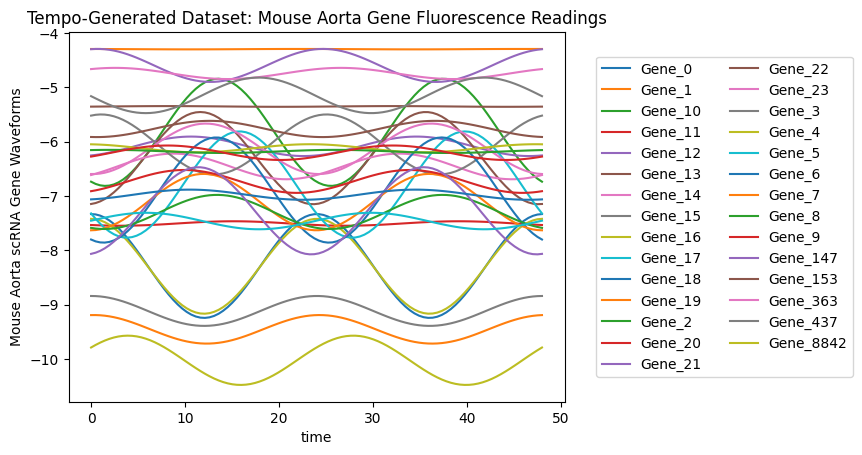

In [ ]:
tempo_df.plot(x = 'time')

plt.ylabel('Mouse Aorta scRNA Gene Waveforms')
plt.title('Tempo-Generated Dataset: Mouse Aorta Gene Fluorescence Readings')
plt.legend(bbox_to_anchor=(1.05, 0.5), ncol=2, loc='center left')

In [ ]:
dinner_smooth.shape

(131, 37)

In [ ]:
# Get colnames
clock_cols = tempo_df\
  .drop(['time'], axis = 1, inplace = False)\
  .columns.tolist()


In [ ]:
len(clock_cols)

29

# MOGP

## MOGP Configs

In [ ]:
tempo_df

,time,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,0.000000,-7.331950,-9.193044,-6.735561,-7.533443,-6.251909,-7.146333,-6.612689,-5.518543,-7.419914,...,-7.453991,-7.061559,-4.290994,-6.153361,-6.273248,-4.295130,-5.911972,-4.661528,-5.160299,-9.789940
1,0.484848,-7.338539,-9.192457,-6.776823,-7.537013,-6.242598,-7.128991,-6.589190,-5.503401,-7.426308,...,-7.434821,-7.056396,-4.291231,-6.151723,-6.258422,-4.290454,-5.913850,-4.654036,-5.201591,-9.742721
2,0.969697,-7.360411,-9.196095,-6.802790,-7.540078,-6.230734,-7.098331,-6.563524,-5.497039,-7.446659,...,-7.416061,-7.049926,-4.291519,-6.150507,-6.242694,-4.290662,-5.913323,-4.647959,-5.241974,-9.700050
3,1.454545,-7.397214,-9.203899,-6.813045,-7.542588,-6.216507,-7.054846,-6.536105,-5.499560,-7.480639,...,-7.398012,-7.042252,-4.291852,-6.149733,-6.226316,-4.295751,-5.910400,-4.643395,-5.280798,-9.662615
4,1.939394,-7.448355,-9.215745,-6.807421,-7.544503,-6.200146,-6.999236,-6.507374,-5.510923,-7.527701,...,-7.380965,-7.033500,-4.292226,-6.149414,-6.209551,-4.305639,-5.905126,-4.640417,-5.317439,-9.631019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,46.060606,-7.456843,-9.236449,-6.434278,-7.515353,-6.261285,-7.080229,-6.678110,-5.660022,-7.532582,...,-7.528596,-7.067820,-4.290614,-6.163521,-6.319041,-4.360026,-5.881578,-4.702937,-4.999326,-10.008278
96,46.545455,-7.403702,-9.219726,-6.527803,-7.520305,-6.263243,-7.116759,-6.666621,-5.613535,-7.484370,...,-7.510866,-7.068488,-4.290620,-6.160517,-6.310013,-4.337326,-5.892398,-4.691187,-5.037624,-9.951003
97,47.030303,-7.364795,-9.206789,-6.610041,-7.525021,-6.262316,-7.140168,-6.651719,-5.574057,-7.449180,...,-7.492321,-7.067654,-4.290686,-6.157794,-6.299252,-4.318756,-5.901159,-4.680254,-5.077650,-9.894926
98,47.515152,-7.340749,-9.197847,-6.679667,-7.529424,-6.258517,-7.150079,-6.633645,-5.542222,-7.427579,...,-7.473260,-7.065332,-4.290811,-6.155396,-6.286931,-4.304615,-5.907719,-4.670315,-5.118763,-9.840949


In [ ]:
TRAIN_HIST = 35
TRAIN_HIST

35

## MOGP Data Prep

In [ ]:
mogptk_data = mogptk.DataSet()

for i, clock_col in enumerate(clock_cols):
    mogptk_data.append(mogptk.Data(tempo_df['time'], tempo_df[clock_col], name = clock_col))
    mogptk_data.transform(mogptk.TransformDetrend(degree=1))
    mogptk_data[i].remove_range(start = TRAIN_HIST)
    # mogptk_data[i].remove_range(start = 0, end = 30)
    # mogptk_data[i] # remove frome nd

(<Figure size 1200x11600 with 29 Axes>,
 array([[<AxesSubplot:title={'center':'Gene_0'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_1'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_10'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_11'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_12'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_13'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_14'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_15'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_16'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_17'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_18'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_19'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Gene_2'}, x

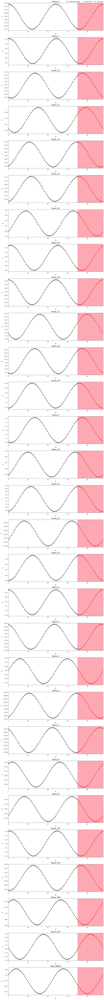

In [ ]:
mogptk_data.plot()

## MOGP Training

In [ ]:
# create model, uncomment for different kernels
mogptk_model = mogptk.MOSM(mogptk_data, Q=4)
# mogptk_model = mogptk.CSM(mogptk_data, Q=4)
# mogptk_model = mogptk.SM_LMC(mogptk_data, Q=2)
# mogptk_model = mogptk.CONV(mogptk_data, Q=2)

# initialize parameters of kernel using LombScargle
mogptk_model.init_parameters(method='BNSE', iters=10)

Starting optimization using Adam
‣ Model: Exact
  ‣ Kernel: MultiOutputSpectralMixtureKernel
  ‣ Likelihood: GaussianLikelihood
‣ Channels: 29
‣ Parameters: 609
‣ Training points: 2117
‣ Iterations: 10
   0/10   0:00:03  loss=    -1057.82  error=     0.16152
   3/10   0:00:13  loss=    -1860.13  error=    0.070383
   6/10   0:00:22  loss=    -1919.63  error=    0.085135
   9/10   0:00:32  loss=    -1943.44  error=    0.104895
  10/10   0:00:35  loss=    -1953.05  error=    0.111783
Optimization finished in 36.722 seconds


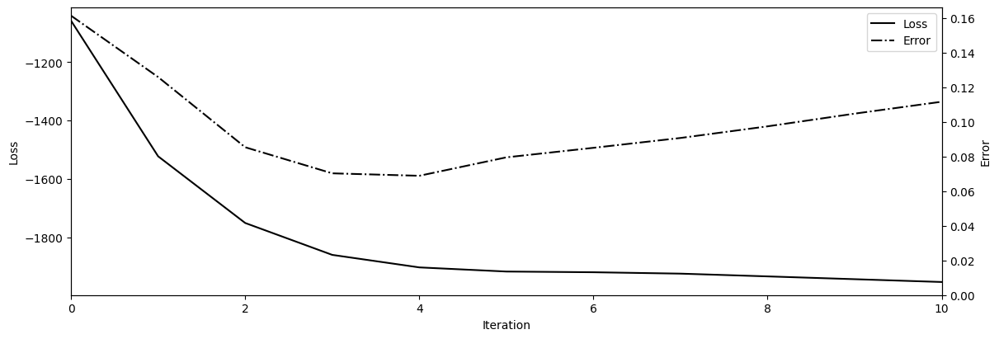

In [ ]:
mogptk_model.train(method='Adam', lr=0.02, iters=10, plot=True, error='MSE', verbose=True);

## MOGP Prediction

### Capture predictions in dataframe

In [ ]:
mogptk_time, mogptk_mu, mogptk_lower_ci, mogptk_upper_ci = mogptk_model.predict(
    X=None,
    ci=None,
    sigma=2,
    n=10000,
    transformed=False
)

In [ ]:
mogptk_mu[0].shape

(100,)

In [ ]:
mogptk_preds_df = pd.DataFrame(mogptk_mu,
                               index = tempo_df.iloc[:, 1:].columns.tolist()).T
mogptk_preds_df.insert(0, 'time', tempo_df['time'].values)
mogptk_preds_df

,time,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,0.000000,-7.329644,-9.188215,-6.863928,-7.558580,-6.210229,-6.818626,-6.609298,-5.577845,-7.417060,...,-7.432749,-7.041943,-4.291224,-6.148956,-6.289126,-4.305793,-5.874859,-4.657226,-5.454429,-9.904294
1,0.484848,-7.337576,-9.190014,-6.770197,-7.557050,-6.217071,-6.881535,-6.600836,-5.555425,-7.424694,...,-7.420208,-7.045159,-4.291467,-6.147764,-6.277383,-4.301677,-5.892113,-4.650056,-5.452856,-9.866670
2,0.969697,-7.357887,-9.195110,-6.687303,-7.555357,-6.219239,-6.923474,-6.586535,-5.538238,-7.443651,...,-7.405868,-7.045923,-4.291747,-6.146832,-6.261471,-4.300728,-5.904740,-4.643675,-5.452931,-9.825751
3,1.454545,-7.391003,-9.203617,-6.617667,-7.553625,-6.216618,-6.943049,-6.567102,-5.527520,-7.474317,...,-7.390206,-7.044188,-4.292060,-6.146206,-6.242048,-4.303201,-5.912565,-4.638469,-5.455515,-9.782764
4,1.939394,-7.437229,-9.215622,-6.561421,-7.551922,-6.209271,-6.939698,-6.543377,-5.524438,-7.516963,...,-7.373806,-7.040000,-4.292405,-6.145931,-6.219993,-4.309349,-5.915615,-4.634752,-5.460899,-9.739172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,46.060606,-7.477867,-9.236300,-5.255001,-7.472359,-6.275028,-7.448035,-6.587619,-5.651400,-7.551897,...,-7.521714,-7.072371,-4.291484,-6.165539,-6.273220,-4.358960,-5.848496,-4.682474,-4.748190,-10.048823
96,46.545455,-7.407960,-9.217453,-5.370631,-7.474382,-6.260361,-7.374402,-6.572782,-5.601121,-7.488229,...,-7.499794,-7.064602,-4.291419,-6.162472,-6.257620,-4.335668,-5.841104,-4.672214,-4.742346,-9.978765
97,47.030303,-7.351117,-9.202273,-5.485525,-7.476201,-6.243553,-7.286239,-6.556629,-5.557715,-7.436492,...,-7.477188,-7.055751,-4.291383,-6.159700,-6.241786,-4.316482,-5.834106,-4.662780,-4.737935,-9.913432
98,47.515152,-7.308257,-9.190994,-5.599432,-7.477949,-6.224679,-7.185233,-6.538744,-5.522212,-7.397520,...,-7.454192,-7.045862,-4.291377,-6.157286,-6.226163,-4.301650,-5.827713,-4.654522,-4.736471,-9.854087


### Modifying MOGPTK plot_prediction


Want to plot a square facet grid

In [ ]:
def plot_prediction(mogptk_model,
                    X=None,
                    title=None,
                    figsize=None,
                    legend=True,
                    errorbars=True,
                    nrows = None,
                    ncols = None,
                    suptitle=None,
                    supfontsize=40,
                    subfontsize=20,
                    ci=None,
                    sigma=2,
                    n=10000,
                    transformed=False):
    """
    Plot the data including removed observations, latent function, and predictions of this model for each channel.

    Args:
        X (list, dict): Array of shape (data_points,), (data_points,input_dims), or [(data_points,)] * input_dims per channel with prediction X values. If a dictionary is passed, the index is the channel index or name.
        title (str): Set the title of the plot.
        figsize (tuple): Set the figure size.
        legend (boolean): Disable legend.
        errorbars (boolean): Plot data error bars if available.
        ci (float,list of float): Confidence interval as a percentage or the two quantile limits [lower, upper] in the range of [0,1].
        sigma (float): Number of standard deviations to display upwards and downwards.
        n (int): Number of samples used from distribution to estimate quantile.
        transformed (boolean): Display transformed Y data as used for training.

    Returns:
        matplotlib.figure.Figure: The figure.
        list of matplotlib.axes.Axes: List of axes.

    Examples:
        >>> fig, axes = dataset.plot(title='Title')
    """
    X, Mu, Lower, Upper = mogptk_model.predict(X, ci=ci, sigma=sigma, n=n, transformed=transformed)
    if len(mogptk_model.dataset) == 1:
        X = [X]
        Mu = [Mu]
        Lower = [Lower]
        Upper = [Upper]

    if figsize is None:
        figsize = (12,4*len(mogptk_model.dataset))

    if nrows == None and ncols == None:
        nrows = len(mogptk_model.dataset)
        ncols = 1

    fig, ax = plt.subplots(nrows = nrows,
                           ncols = ncols,
                           figsize=figsize,
                           squeeze=False,
                           constrained_layout=True)
    for j, data in enumerate(mogptk_model.dataset):
        r, c = divmod(j, ncols)

        # TODO: ability to plot conditional or marginal distribution to reduce input dims
        if data.get_input_dims() > 2:
            raise ValueError("cannot plot more than two input dimensions")
        if data.get_input_dims() == 2:
            raise NotImplementedError("two dimensional input data not yet implemented") # TODO

        legends = []
        if errorbars and data.Y_err is not None:
            x, y = data.get_train_data(transformed=transformed)
            yl = data.Y[data.mask] - data.Y_err[data.mask]
            yu = data.Y[data.mask] + data.Y_err[data.mask]
            if transformed:
                yl = data.Y_transformer.forward(yl, x)
                yu = data.Y_transformer.forward(yu, x)
            x = x.astype(data.X_dtypes[0])
            ax[j,0].errorbar(x, y, [y-yl, yu-y], elinewidth=1.5, ecolor='lightgray', capsize=0, ls='', marker='')

        # prediction
        idx = np.argsort(X[j][:,0])
        x = X[j][idx,0].astype(data.X_dtypes[0])
        ax[r, c].plot(x, Mu[j][idx], ls=':', color='blue', lw=2)
        if not np.all(Lower[j][idx] == Mu[j][idx]) and not np.all(Upper[j][idx] == Mu[j][idx]):
            ax[r, c].fill_between(x, Lower[j][idx], Upper[j][idx], color='blue', alpha=0.3)
            legends.append(patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='blue', alpha=0.3, lw=0, label='95% Error Bars'
            ))
        legends.append(plt.Line2D([0], [0], ls=':', color='blue', lw=2, label='Posterior Mean'))

        xmin = min(np.min(data.X), np.min(X[j]))
        xmax = max(np.max(data.X), np.max(X[j]))
        if data.F is not None:
            if np.issubdtype(data.X_dtypes[0], np.datetime64):
                dt = np.timedelta64(1,data.X.get_time_unit())
                n = int((xmax-xmin) / dt) + 1
                x = np.arange(xmin, xmax+np.timedelta64(1,'us'), dt, dtype=data.X_dtypes[0])
            else:
                n = len(data.X)*10
                x = np.linspace(xmin, xmax, n)

            y = data.F(x)
            if transformed:
                y = data.Y_transformer.forward(y, x)

            ax[r, c].plot(x, y, 'g--', lw=1)
            legends.append(plt.Line2D([0], [0], ls='--', color='g', label='Latent'))

        if data.has_test_data():
            x, y = data.get_test_data(transformed=transformed)
            x = x.astype(data.X_dtypes[0])
            ax[r, c].plot(x, y, 'r.', ms=10)
            legends.append(plt.Line2D([0], [0], ls='', color='r', marker='.', ms=10, label='Test data'))

        x, y = data.get_train_data(transformed=transformed)
        x = x.astype(data.X_dtypes[0])
        ax[r, c].plot(x, y, 'k.', ms=10)
        legends.append(plt.Line2D([0], [0], ls='', color='k', marker='.', ms=10, label='Train data'))

        if 0 < len(data.removed_ranges[0]):
            for removed_range in data.removed_ranges[0]:
                x0 = removed_range[0].astype(data.X_dtypes[0])
                x1 = removed_range[1].astype(data.X_dtypes[0])
                y0 = ax[r, c].get_ylim()[0]
                y1 = ax[r, c].get_ylim()[1]
                ax[r, c].add_patch(patches.Rectangle(
                    (x0, y0), x1-x0, y1-y0, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0,
                ))
            legends.insert(0, patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0, label='Removed Ranges'
            ))

        xmin = xmin.astype(data.X_dtypes[0])
        xmax = xmax.astype(data.X_dtypes[0])
        ax[r, c].set_xlim(xmin-(xmax-xmin)*0.001, xmax+(xmax-xmin)*0.001)
        ax[r, c].set_xlabel(data.X_labels[0])
        ax[r, c].set_ylabel(data.Y_label)
        ax[r, c].set_title(data.name if title is None else title, fontsize=subfontsize)

        if legend:
           plt.legend(handles=legends[::-1])

        fig.suptitle(suptitle, fontsize=supfontsize)
    return fig, ax

<ipython-input-39-bb5730f98743>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_tempo_q4_mosm.png"))
<ipython-input-39-bb5730f98743>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_tempo_q4_mosm.png"))
<ipython-input-39-bb5730f98743>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_tempo_q4_mosm.png"))
<ipython-input-39-bb5730f98743>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.

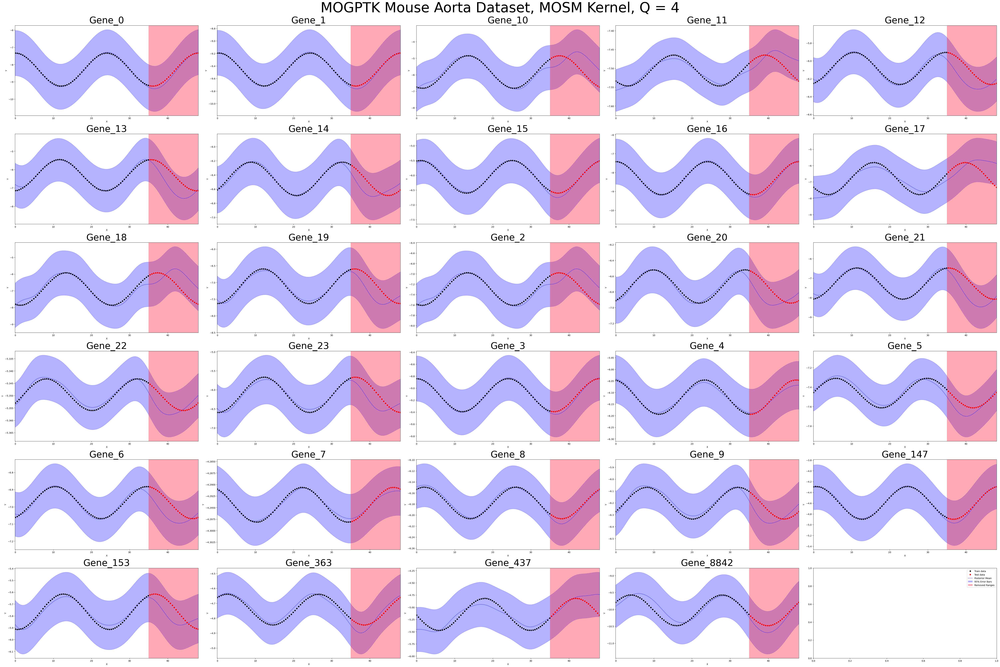

In [ ]:
suptitle = 'MOGPTK Mouse Aorta Dataset, MOSM Kernel, Q = 4'

plot_prediction(mogptk_model = mogptk_model,
                nrows = 6,
                ncols = 5,
                figsize = (60, 40),
                suptitle = suptitle,
                supfontsize=60,
                subfontsize= 40)

plt.savefig(os.path.join(plots_path, "mogptk_tempo_q4_mosm.png"))
plt.show()

In [ ]:
mogptk_model.print_parameters()

Name,Range,Value
MultiOutputSpectralMixtureKernel.weight,"[1e-08, ∞)",[[1.86843303 1.24379492 0.92479179 0.62286908] [3.16491417 1.01542551 0.96012368 0.68331733] [2.28213727 0.75520517 0.59645037 0.45082194] [2.19666039 0.86993024 0.72444562 0.45231317] [1.77848099 1.15473071 0.8950054 0.63626344] [1.66641682 0.90899457 0.87235258 0.55837067] [3.22684656 1.48397239 1.38898907 1.01638037] [3.39333199 1.66183703 1.4544758 1.0770384 ] [3.29987362 1.45712103 1.39251482 1.05343006] [3.65227125 1.4024228 1.07649708 0.82726677] [2.86368515 1.8393709 1.41444212 1.05763442] [3.23046486 1.43978192 1.09414563 0.92611943] [2.62737475 1.63945163 0.73172054 0.52227656] [2.77143937 2.13494704 0.82879778 0.50555387] [3.57803958 1.91596475 1.21383425 0.81324212] [3.67061024 1.96224804 1.22180472 0.81284089] [3.18385455 1.94574252 1.12812756 0.79847415] [3.19562855 2.23829824 1.23494255 0.86932391] [2.2012219 1.09455907 0.94021629 0.73398283] [2.42521436 1.1130781 1.00383362 0.77155418] [2.29990253 0.92455213 0.73083892 0.56785583] [1.85685674 0.97718085 0.66680985 0.56553508] [1.80193338 1.32646222 0.88673444 0.6740211 ] [1.99691173 1.06965148 0.9171345 0.6871047 ] [3.34757105 2.10598152 1.37776675 0.95771896] [3.57199941 1.78249848 1.5145713 1.09968948] [3.24235562 1.87461991 1.36463817 0.92966103] [3.27435316 1.8362021 1.38505726 0.91945211] [3.62136405 1.30228667 1.26513076 1.03211892] [3.2950468 2.24649909 1.33412173 0.95519672] [2.57223594 1.30296789 1.00494032 0.80471542] [2.37189422 1.71406411 0.96459859 0.55556951] [2.85378161 1.26216688 1.0929613 0.94279334] [2.74237 1.10874544 0.76159612 0.76336602] [2.02860839 1.17599364 0.90305326 0.66831979] [2.29956021 1.5435428 0.97488878 0.7136616 ]]
MultiOutputSpectralMixtureKernel.mean,"[1e-08, 0.6666666666666666]",[[[0.03698917] [0.02279548] [0.07405546] [0.08372496]] [[0.01321648] [0.04237608] [0.03013513] [0.03929427]] [[0.04171358] [0.06858681] [0.08231886] [0.11909471]] [[0.04906738] [0.06543006] [0.07406239] [0.13135138]] [[0.04904352] [0.03078103] [0.06424144] [0.07909369]] [[0.04909751] [0.03217547] [0.06443422] [0.07920938]] [[0.04896065] [0.03083848] [0.06438266] [0.09369354]] [[0.04901194] [0.02329953] [0.0642858 ] [0.09371027]] [[0.04905545] [0.02332898] [0.06430921] [0.09365585]] [[0.04904953] [0.0655751 ] [0.0822747 ] [0.09366611]] [[0.04894544] [0.02330681] [0.07407743] [0.08364429]] [[0.04893347] [0.07101928] [0.08226877] [0.03060808]] [[0.04904391] [0.01762986] [0.06460819] [0.0935807 ]] [[0.04903479] [0.01767945] [0.06452533] [0.07906895]] [[0.04901404] [0.01760716] [0.06451125] [0.09367333]] [[0.04904412] [0.0176194 ] [0.06436768] [0.09372726]] [[0.04907705] [0.01769615] [0.07417922] [0.08396375]] [[0.04905585] [0.01770012] [0.07396706] [0.08378848]] [[0.0490888 ] [0.03081813] [0.06459483] [0.08362398]] [[0.04911661] [0.03088449] [0.06458284] [0.08377301]] [[0.04898233] [0.07106193] [0.02403837] [0.10626355]] [[0.04895414] [0.01779867] [0.0739643 ] [0.09360952]] [[0.04901605] [0.0231456 ] [0.07408568] [0.08364963]] [[0.04902172] [0.02340787] [0.07404236] [0.08374356]] [[0.04499391] [0.02155426] [0.07132366] [0.0837716 ]] [[0.04477527] [0.03062903] [0.07165676] [0.09367407]] [[0.04503786] [0.02155803] [0.07138026] [0.07916987]] [[0.04495344] [0.0215309 ] [0.07138314] [0.07907083]] [[0.04494862] [0.0710361 ] [0.02396341] [0.08384665]] [[0.04499404] [0.02158576] [0.07143258] [0.07910911]] [[0.04164609] [0.02344736] [0.06387514] [0.09371374]] [[0.04156851] [0.02328582] [0.06430471] [0.11912351]] [[0.04901709] [0.065676 ] [0.01157545] [0.08386428]] [[0.0417284 ] [0.06863423] [0.10379878] [0.02476415]] [[0.04896342] [0.02337503] [0.07406619] [0.08391088]] [[0.0489315 ] [0.02332692] [0.07403329] [0.08385747]]]
MultiOutputSpectralMixtureKernel.variance,"[1e-08, ∞)",[[[1.53454795e-04] [6.62025898e-07] [1.54077380e-05] [1.34661842e-05]] [[7.91376169e-06] [1.62045633e-05] [8.70618878e-06] [1.13778202e-05]] [[5.37960955e-05] [8.93877823e-06] [1.05344154e-05] [1.85034118e-05]] [[5.7748

## MOGP Covariance Matrix

In [ ]:
# K = self.gpr.K(X).cpu().numpy()

# # normalise
# diag_sqrt = np.sqrt(np.diag(K))
# K /= np.outer(diag_sqrt, diag_sqrt)


output_dims = len(mogptk_model.dataset)
X_ = np.zeros((output_dims, 2))
X_[:,0] = np.arange(output_dims)
K = mogptk_model.gpr.K(X_).cpu().numpy()

# normalize
diag_sqrt = np.sqrt(np.diag(K))
K /= np.outer(diag_sqrt, diag_sqrt)

# Transform numpy array to dataframe
gene_cols = tempo_df.iloc[:, 1:].columns.tolist()
mogptk_covariance_df = pd.DataFrame(K, index = gene_cols, columns = gene_cols)

mogptk_covariance_df

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
Gene_0,1.000000,0.999151,0.185712,0.094769,0.125999,0.074962,0.118896,0.936138,0.999993,0.024402,...,0.498958,0.127180,0.712790,0.900888,0.141010,0.982506,-0.003327,0.792347,-0.021875,0.530909
Gene_1,0.999151,1.000000,0.178292,0.089034,0.137049,0.079577,0.128664,0.944776,0.999036,0.019895,...,0.517234,0.138266,0.707753,0.905655,0.152183,0.987958,-0.004580,0.811107,-0.023407,0.551107
Gene_10,0.185712,0.178292,1.000000,0.869147,0.002668,0.005486,0.002391,0.141001,0.186213,0.732918,...,0.053549,0.002534,0.091704,0.239931,0.003249,0.151869,0.001459,0.083427,0.508010,0.045391
Gene_11,0.094769,0.089034,0.869147,1.000000,0.006095,0.005308,0.001743,0.083703,0.094816,0.948428,...,0.022166,0.006905,-0.107523,0.136104,0.007027,0.083410,0.001076,0.031634,0.821545,0.019660
Gene_12,0.125999,0.137049,0.002668,0.006095,1.000000,0.833026,0.865888,0.211346,0.125004,0.002078,...,0.723234,0.999321,0.019524,0.224707,0.816621,0.185531,0.535952,0.349188,0.006940,0.672549
Gene_13,0.074962,0.079577,0.005486,0.005308,0.833026,1.000000,0.613604,0.135481,0.074246,0.006429,...,0.562898,0.816106,-0.008159,0.178442,0.519195,0.114400,0.774413,0.162132,0.002807,0.448617
Gene_14,0.118896,0.128664,0.002391,0.001743,0.865888,0.613604,1.000000,0.221017,0.117929,0.001415,...,0.730842,0.874574,0.021861,0.204847,0.917937,0.179945,0.285440,0.397556,0.000224,0.716419
Gene_15,0.936138,0.944776,0.141001,0.083703,0.211346,0.135481,0.221017,1.000000,0.935163,0.042767,...,0.660793,0.212352,0.568829,0.941497,0.258781,0.972363,0.000014,0.912374,0.003845,0.695066
Gene_16,0.999993,0.999036,0.186213,0.094816,0.125004,0.074246,0.117929,0.935163,1.000000,0.024124,...,0.496915,0.126189,0.714418,0.900002,0.139945,0.981852,-0.003347,0.790757,-0.022286,0.528870
Gene_17,0.024402,0.019895,0.732918,0.948428,0.002078,0.006429,0.001415,0.042767,0.024124,1.000000,...,0.011524,0.002690,-0.238580,0.087657,0.005073,0.026681,0.001562,0.001012,0.932092,0.004532


<ipython-input-41-1f37c16d8054>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_mosm_tempo_heatmap.png"))
<ipython-input-41-1f37c16d8054>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_mosm_tempo_heatmap.png"))
<ipython-input-41-1f37c16d8054>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_mosm_tempo_heatmap.png"))
<ipython-input-41-1f37c16d8054>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer support

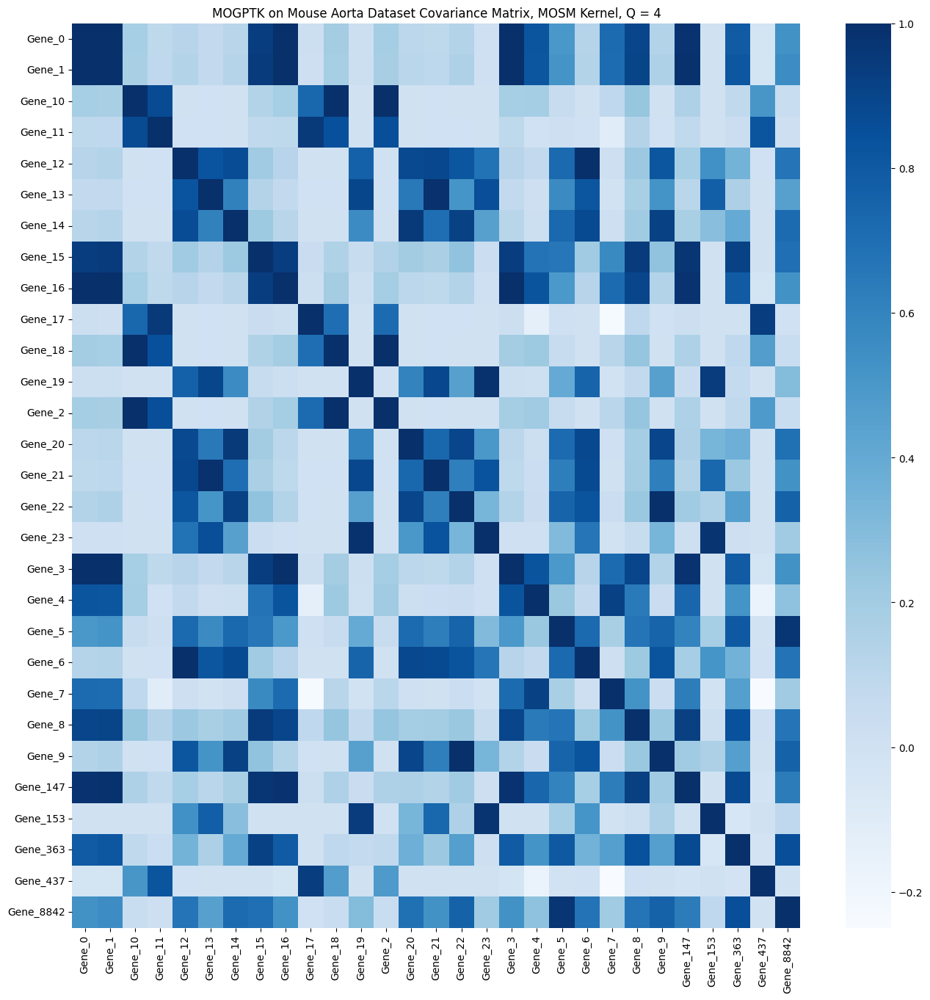

In [ ]:
plt.figure(figsize=(16,16))
sns.heatmap(mogptk_covariance_df, cmap = 'Blues', xticklabels=True, yticklabels=True)
plt.title('MOGPTK on Mouse Aorta Dataset Covariance Matrix, MOSM Kernel, Q = 4')
plt.savefig(os.path.join(plots_path, "mogptk_mosm_tempo_heatmap.png"))


## MOGP Performance Metrics

In [ ]:
tempo_df.iloc[:, 1:]

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,-7.331950,-9.193044,-6.735561,-7.533443,-6.251909,-7.146333,-6.612689,-5.518543,-7.419914,-7.320285,...,-7.453991,-7.061559,-4.290994,-6.153361,-6.273248,-4.295130,-5.911972,-4.661528,-5.160299,-9.789940
1,-7.338539,-9.192457,-6.776823,-7.537013,-6.242598,-7.128991,-6.589190,-5.503401,-7.426308,-7.419993,...,-7.434821,-7.056396,-4.291231,-6.151723,-6.258422,-4.290454,-5.913850,-4.654036,-5.201591,-9.742721
2,-7.360411,-9.196095,-6.802790,-7.540078,-6.230734,-7.098331,-6.563524,-5.497039,-7.446659,-7.509534,...,-7.416061,-7.049926,-4.291519,-6.150507,-6.242694,-4.290662,-5.913323,-4.647959,-5.241974,-9.700050
3,-7.397214,-9.203899,-6.813045,-7.542588,-6.216507,-7.054846,-6.536105,-5.499560,-7.480639,-7.587467,...,-7.398012,-7.042252,-4.291852,-6.149733,-6.226316,-4.295751,-5.910400,-4.643395,-5.280798,-9.662615
4,-7.448355,-9.215745,-6.807421,-7.544503,-6.200146,-6.999236,-6.507374,-5.510923,-7.527701,-7.652537,...,-7.380965,-7.033500,-4.292226,-6.149414,-6.209551,-4.305639,-5.905126,-4.640417,-5.317439,-9.631019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-7.456843,-9.236449,-6.434278,-7.515353,-6.261285,-7.080229,-6.678110,-5.660022,-7.532582,-6.853762,...,-7.528596,-7.067820,-4.290614,-6.163521,-6.319041,-4.360026,-5.881578,-4.702937,-4.999326,-10.008278
96,-7.403702,-9.219726,-6.527803,-7.520305,-6.263243,-7.116759,-6.666621,-5.613535,-7.484370,-6.976860,...,-7.510866,-7.068488,-4.290620,-6.160517,-6.310013,-4.337326,-5.892398,-4.691187,-5.037624,-9.951003
97,-7.364795,-9.206789,-6.610041,-7.525021,-6.262316,-7.140168,-6.651719,-5.574057,-7.449180,-7.096921,...,-7.492321,-7.067654,-4.290686,-6.157794,-6.299252,-4.318756,-5.901159,-4.680254,-5.077650,-9.894926
98,-7.340749,-9.197847,-6.679667,-7.529424,-6.258517,-7.150079,-6.633645,-5.542222,-7.427579,-7.212014,...,-7.473260,-7.065332,-4.290811,-6.155396,-6.286931,-4.304615,-5.907719,-4.670315,-5.118763,-9.840949


In [ ]:
mogptk_preds_df.iloc[:, 1:]

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,-7.329644,-9.188215,-6.863928,-7.558580,-6.210229,-6.818626,-6.609298,-5.577845,-7.417060,-7.982167,...,-7.432749,-7.041943,-4.291224,-6.148956,-6.289126,-4.305793,-5.874859,-4.657226,-5.454429,-9.904294
1,-7.337576,-9.190014,-6.770197,-7.557050,-6.217071,-6.881535,-6.600836,-5.555425,-7.424694,-7.977990,...,-7.420208,-7.045159,-4.291467,-6.147764,-6.277383,-4.301677,-5.892113,-4.650056,-5.452856,-9.866670
2,-7.357887,-9.195110,-6.687303,-7.555357,-6.219239,-6.923474,-6.586535,-5.538238,-7.443651,-7.969616,...,-7.405868,-7.045923,-4.291747,-6.146832,-6.261471,-4.300728,-5.904740,-4.643675,-5.452931,-9.825751
3,-7.391003,-9.203617,-6.617667,-7.553625,-6.216618,-6.943049,-6.567102,-5.527520,-7.474317,-7.959222,...,-7.390206,-7.044188,-4.292060,-6.146206,-6.242048,-4.303201,-5.912565,-4.638469,-5.455515,-9.782764
4,-7.437229,-9.215622,-6.561421,-7.551922,-6.209271,-6.939698,-6.543377,-5.524438,-7.516963,-7.947967,...,-7.373806,-7.040000,-4.292405,-6.145931,-6.219993,-4.309349,-5.915615,-4.634752,-5.460899,-9.739172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-7.477867,-9.236300,-5.255001,-7.472359,-6.275028,-7.448035,-6.587619,-5.651400,-7.551897,-5.744815,...,-7.521714,-7.072371,-4.291484,-6.165539,-6.273220,-4.358960,-5.848496,-4.682474,-4.748190,-10.048823
96,-7.407960,-9.217453,-5.370631,-7.474382,-6.260361,-7.374402,-6.572782,-5.601121,-7.488229,-5.766914,...,-7.499794,-7.064602,-4.291419,-6.162472,-6.257620,-4.335668,-5.841104,-4.672214,-4.742346,-9.978765
97,-7.351117,-9.202273,-5.485525,-7.476201,-6.243553,-7.286239,-6.556629,-5.557715,-7.436492,-5.792584,...,-7.477188,-7.055751,-4.291383,-6.159700,-6.241786,-4.316482,-5.834106,-4.662780,-4.737935,-9.913432
98,-7.308257,-9.190994,-5.599432,-7.477949,-6.224679,-7.185233,-6.538744,-5.522212,-7.397520,-5.824227,...,-7.454192,-7.045862,-4.291377,-6.157286,-6.226163,-4.301650,-5.827713,-4.654522,-4.736471,-9.854087


### Pooled MSE

In [ ]:
mogptk_pooled_mse = pooled_mse(pred_df = mogptk_preds_df.iloc[:, 1:],
                                true_df = tempo_df.iloc[:, 1:])

### R2

In [ ]:
mogptk_r2 = r2_score(y_true = tempo_df.iloc[:, 1:], y_pred = mogptk_preds_df.iloc[:, 1:])

In [ ]:
print(f"The Pooled MSE of the MOGPTK Model is {mogptk_pooled_mse}.")
print(f"The R^2 of the MOGPTK Model is {mogptk_r2}.")

The Pooled MSE of the MOGPTK Model is 0.03395502261263041.
The R^2 of the MOGPTK Model is 0.7914998235884311.


# NCDE (Noise-Perturbed)

## NCDE Configs

In [ ]:
# Data params
N_SNAPSHOTS = 5000 # number of observations
N_TIMEPOINTS = tempo_df.shape[0] # number of datapoints

# Model params
HIDDEN_SIZE = 16
WIDTH_SIZE = 32 # The size of each hidden layer.
OUTPUT_SIZE = tempo_df.shape[1] - 1 # output size, which here is the number of genes we want to output. # features = # genes = # columns in waves_df - 1 (because of time column)
DEPTH = 8
SEED = 12314
KEY = jr.PRNGKey(SEED)
train_data_key, test_data_key, model_key, loader_key = jr.split(KEY, 4)

add_noise = False
BATCH_SIZE = 32
lr = 1e-2
steps = 500

# Suppose we have lag-p auto-regressors
WINDOW_LENGTH = 4000
STEPSIZE = 10
NCDE_TRAIN_HIST_PROP = 0.8

## Helper Functions + Specify Model

In [ ]:
# First, define the function which will specify the vector field of
# the differential equation.
class Func(eqx.Module):
    mlp: eqx.nn.MLP
    data_size: int
    hidden_size: int

    def __init__(self, data_size, hidden_size, width_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        self.data_size = data_size
        self.hidden_size = hidden_size
        self.mlp = eqx.nn.MLP(
            hidden_size,
            hidden_size * data_size,
            width_size,
            depth,
            activation=jnn.tanh,
            # Note the use of a tanh final activation function. This is important to
            # stop the model blowing up. (Just like how GRUs and LSTMs constrain the
            # rate of change of their hidden states.)
            final_activation=jnn.tanh,
            key=key,
        )

    def __call__(self, t, y, args):
        return self.mlp(y).reshape(self.hidden_size, self.data_size)

# The above Func will be solved as part of the NeuralCDE algo
# Below. Note we do have an MLP for the initial condition
# As well as the future iterations.

class NeuralCDE(eqx.Module):
    initial: eqx.nn.MLP
    func: Func
    linear: eqx.nn.Linear

    def __init__(self, data_size, hidden_size, width_size, output_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        ikey, fkey, lkey = jr.split(key, 3)
        self.initial = eqx.nn.MLP(in_size = data_size,
                                  out_size = hidden_size,
                                  width_size = width_size,
                                  depth = depth,
                                  key = ikey)
        self.func = Func(data_size, hidden_size, width_size, depth, key=fkey)
        self.linear = eqx.nn.Linear(hidden_size, output_size, key=lkey)

    def __call__(self, ts, coeffs, evolving_out=False):
        # Each sample of data consists of some timestamps `ts`, and some `coeffs`
        # parameterising a control path. These are used to produce a continuous-time
        # input path `control`.
        control = diffrax.CubicInterpolation(ts, coeffs) # X term
        print(f"Finished control with {control}")
        term = diffrax.ControlTerm(self.func, control).to_ode() # dXt term in NCDE
        solver = diffrax.Tsit5()
        dt0 = None
        y0 = self.initial(control.evaluate(ts[0]))

        print(f"ts[0] shape: {ts[0].shape}")
        print(f"y0 shape: {y0.shape}")

        if evolving_out:
            saveat = diffrax.SaveAt(ts=ts)
        else:
            saveat = diffrax.SaveAt(t1=True)
        solution = diffrax.diffeqsolve(
            term,
            solver,
            ts[0],
            ts[-1],
            dt0,
            y0,
            stepsize_controller=diffrax.PIDController(rtol=1e-3, atol=1e-6),
            saveat=saveat,
        )

        # return solution.ys, y0
        if evolving_out:
            # applies self.linear to every value of y (meaning at every timepoint)
            prediction = jax.vmap(lambda y: self.linear(y))(solution.ys) # jax.vmap(lambda y: jnn.tanh(self.linear(y)[0])(solution.ys)
        else:
            # print(f"solution.ys has shape {solution.ys.shape}")
            prediction = self.linear(solution.ys[-1]) # jnn.tanh(self.linear(solution.ys[-1])) # (prediction, )
        return prediction

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size

def window_stack(df, width=3, stepsize=1):
    """
    Takes in waves_df (T, G) dimension (T = # timepoints, G = # genes)
    and slides a window of length width (W), sliding over on stepsize at a time,
    to return two datasets:

    1. Jax array of feature vectors, size (T - W, G, W)
    2. Jax array of target vectors, size (T - W, G, 1)
    """

    dat = df.drop(labels = 'time', axis = 1) # remove time column
    dat = dat.T # transpose from [time, genes] to [genes, time]
    dat = dat.values # only gets values, which will make us lose gene index
    max_T = dat.shape[1] # number of timepoints
    range_T = df.time.to_list() # store all timepoints in a list

    # Create windowed Jax array for features (technically autoregressors)
    feat_window_list = [dat[:, k: (k + width)] for k in range(0, max_T - width, stepsize)]
    feat_window_jnp = jnp.array(feat_window_list) # turns this into a Jax array of size [T - W, G, W]
    feat_window_jnp = jnp.moveaxis(feat_window_jnp, -1, -2) # transposes last two axis so we get [T - W, W, G]

    # Prep timepoints to be stacked with the features, as this is a requirement for the diffrax training method
    time_window_jnp = jnp.array([range_T[k:k + width] for k in range(0, max_T - width, stepsize)]) # size [T - W, W]
    time_windowed = jnp.expand_dims(time_window_jnp, -1) # to [T - W, W, 1]

    # Concatenate (T - W, W, G) tensor of features with (T - W, W, 1) tensor of time to get a (T - W, W, G + 1) tensor of features + time
    x_windowed = jnp.concatenate([time_windowed, feat_window_jnp], axis = -1)

    # Create windowed Jax array for target (= response) variables
    target_window_list = [dat[:, k + width] for k in range(0, max_T - width, stepsize)]
    target_window_jnp = jnp.array(target_window_list) # turns into a Jax array of size [T - W, G]
    y_windowed = jnp.expand_dims(target_window_jnp, -2) # makes it same dimensionality as feat_window_jnp, i.e., [T - W, G] to [T - W, 1, G]

    return x_windowed, y_windowed, time_windowed

# Modeling Functions
def train_test_split(X, y, t, pct_hist):
    max_T = X.shape[0]
    hist_cutoff = int(max_T * pct_hist)

    X_hist, y_hist, t_hist = X[:hist_cutoff, :, :], y[:hist_cutoff, :, :], t[:hist_cutoff, :, :]
    X_future, y_future, t_future = X[hist_cutoff:, :, :], y[hist_cutoff:, :, :], t[hist_cutoff:, :, :]

    return X_hist, y_hist, t_hist, X_future, y_future, t_future


def cubic_spline_interpolation(X_stack, t_stack):
    # Do cubic spline interpolation to get X
    if t_stack.ndim == 3:
        t_stack = t_stack[:, :, 0]

    coeffs = jax.vmap(diffrax.backward_hermite_coefficients)(t_stack, X_stack)

    return coeffs

## Data Transformations for Training

In [ ]:
dinner_noise_iter = []

for i in range(N_SNAPSHOTS):
  dinner_wo_time = tempo_df.iloc[:, 1:] # shape :  (n_timepoints, n_genes)
  noise = np.random.normal(0, 0.001, dinner_wo_time.shape)
  dinner_wo_time = dinner_wo_time + noise # (n_timepoints, n_genes + 1)

  dinner_noise_iter.append(dinner_wo_time)

dinner_noise_iter = np.stack(dinner_noise_iter) # (n_shapshots, n_timepoints, n_genes + 1)

dinner_noise_iter.shape

(5000, 100, 29)

In [ ]:
# Get a 1D vector of timepoints from the dataset
t_vec = tempo_df['time'].values.reshape(-1, 1)
print(f"Shape of t_vec: {t_vec.shape}")
# repeat over N_SNAPSHOTS rows to prep for the NCDE training format
t_mat = np.tile(t_vec, (N_SNAPSHOTS, 1, 1))
print(f"Shape of t_mat: {t_mat.shape}")
# Prep it for training by removing the third dimension and remove last timepoint to fit training X_waveforms later
t_mat2d = t_mat[:, :N_TIMEPOINTS - 1, 0]
print(f"Shape of the t_mat2d is currently {t_mat2d.shape}.")

# Concatenate training data with timestamps to create waveforms_all
waveforms_all = jnp.concatenate([t_mat, dinner_noise_iter], axis = -1)
print(f"Shape of the waveforms_all is currently {waveforms_all.shape}")

# Split data into X and y
X_waveforms = waveforms_all[:, :N_TIMEPOINTS - 1, :]
y_waveforms = dinner_noise_iter[:, N_TIMEPOINTS - 1:, :]
y_waveforms_evol = dinner_noise_iter[:, :N_TIMEPOINTS - 1, :]
print(f"Created X_waveforms with shape {X_waveforms.shape} and y_waveforms with shape {y_waveforms.shape}.")

# Create cubic spline over X
coeffs = cubic_spline_interpolation(X_waveforms, t_mat2d)
print(f"Length of the coefficients is currently {len(coeffs)} with each element having shape {coeffs[0].shape}.")


Shape of t_vec: (100, 1)
Shape of t_mat: (5000, 100, 1)
Shape of the t_mat2d is currently (5000, 99).
Shape of the waveforms_all is currently (5000, 100, 30)
Created X_waveforms with shape (5000, 99, 30) and y_waveforms with shape (5000, 1, 29).
Length of the coefficients is currently 4 with each element having shape (5000, 98, 30).


## Train NCDE Model

### Run: 4/13/2025 7:04 PM, 500 steps, Depth = 4 (2x)

Finished control with CubicInterpolation(
  ts=f32[99], coeffs=[f32[98,30], f32[98,30], f32[98,30], f32[98,30]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 99, 29); y_pred: (32, 99, 29).
Step: 0, Loss: 57.877933502197266, Accuracy: 57.877933502197266, Computation time: 14.16399598121643
Step: 1, Loss: 57.61573791503906, Accuracy: 57.61573791503906, Computation time: 0.6568732261657715
Step: 2, Loss: 57.36921691894531, Accuracy: 57.36921691894531, Computation time: 0.5613441467285156
Step: 3, Loss: 57.129032135009766, Accuracy: 57.129032135009766, Computation time: 0.5328190326690674
Step: 4, Loss: 56.8762321472168, Accuracy: 56.8762321472168, Computation time: 0.5415148735046387
Step: 5, Loss: 56.63338851928711, Accuracy: 56.63338851928711, Computation time: 0.5456573963165283
Step: 6, Loss: 56.397552490234375, Accuracy: 56.397552490234375, Computation time: 0.5734713077545166
Step: 7, Loss: 56.15790939331055, Accuracy: 56.15790939331055, Computation time: 0.6264984607696533
Step: 8

<ipython-input-53-624a9a767f34>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("neural_cde.png")
<ipython-input-53-624a9a767f34>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("neural_cde.png")
<ipython-input-53-624a9a767f34>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("neural_cde.png")
<ipython-input-53-624a9a767f34>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("neural_cde.png")


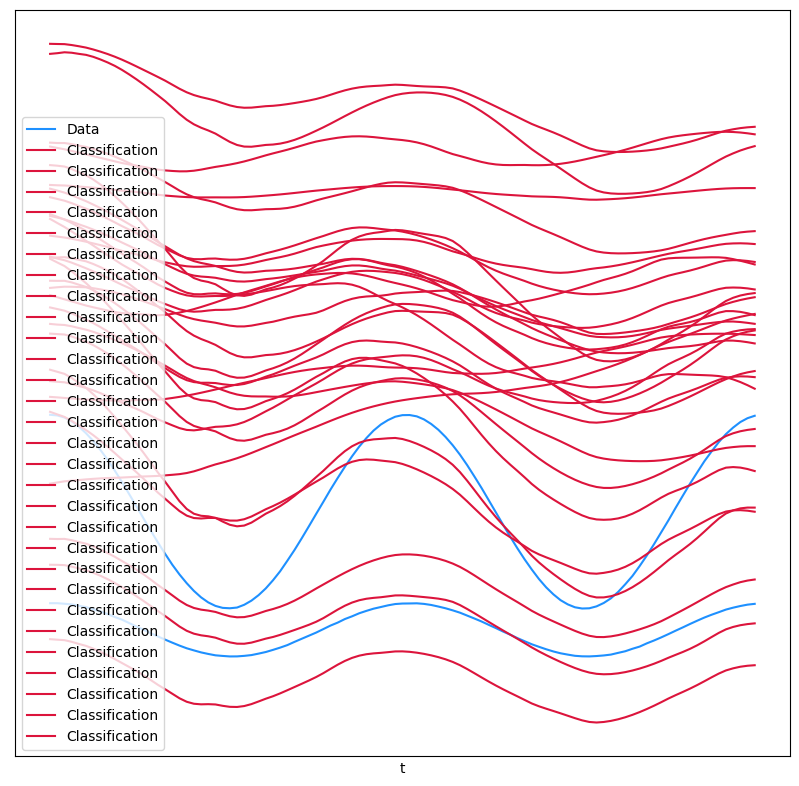

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_tempo_cde.png")
plt.show()

## Plot Predictions

Finished control with CubicInterpolation(
  ts=f64[99](numpy), coeffs=(f32[98,30], f32[98,30], f32[98,30], f32[98,30])
)
ts[0] shape: ()
y0 shape: (16,)


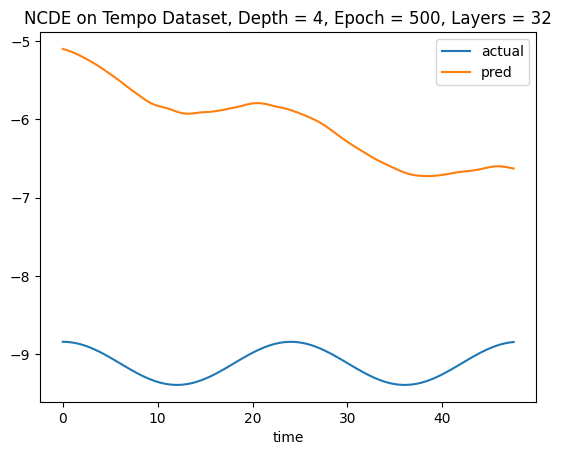

In [ ]:
ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

samp_idx = 17
colname = tempo_df.iloc[:, 1:].columns.tolist()[samp_idx]

actual_data = tempo_df.iloc[:-1, :].loc[:, colname].values
pred_data = ncde_pred_df[:, samp_idx - 1]

sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

# Plot
sample_pred_df.plot(x = 't')
plt.xlabel('time')
plt.title('NCDE on Tempo Dataset, Depth = 4, Epoch = 500, Layers = 32')
plt.show()

Finished control with CubicInterpolation(
  ts=f64[99](numpy), coeffs=(f32[98,30], f32[98,30], f32[98,30], f32[98,30])
)
ts[0] shape: ()
y0 shape: (16,)


<ipython-input-55-2ba4d6f836ea>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'ncde_tempo_d4_ep500_l32.png'))
<ipython-input-55-2ba4d6f836ea>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'ncde_tempo_d4_ep500_l32.png'))
<ipython-input-55-2ba4d6f836ea>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'ncde_tempo_d4_ep500_l32.png'))
<ipython-input-55-2ba4d6f836ea>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported

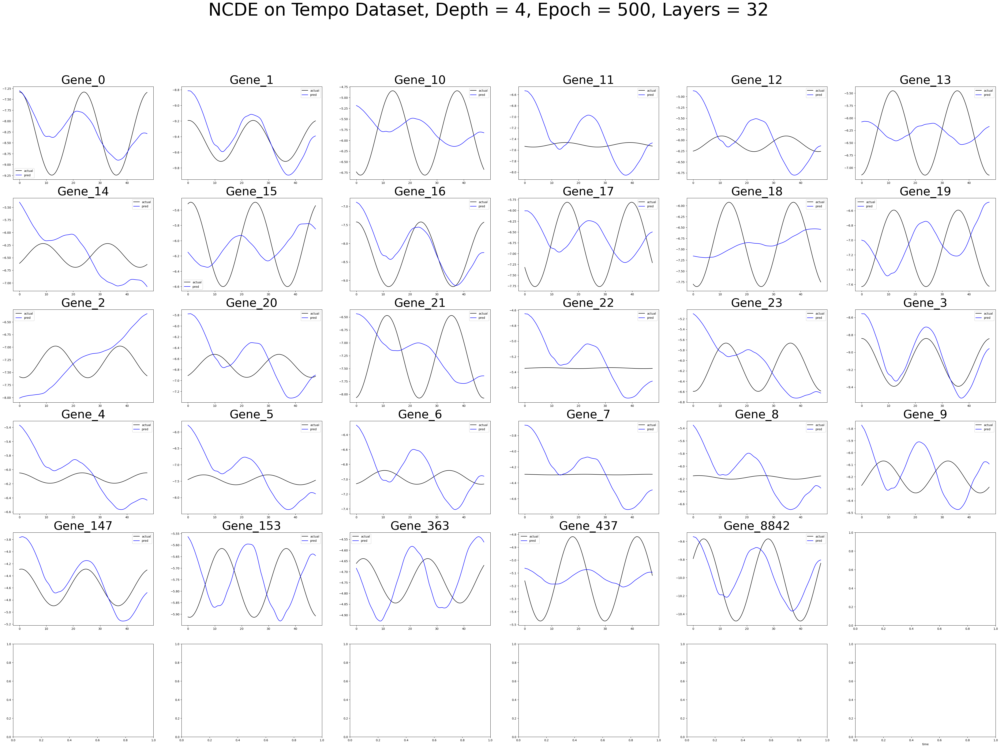

In [ ]:
gene_cols = tempo_df.iloc[:, 1:].columns.tolist()

ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)
ncde_pred_df = pd.DataFrame(ncde_pred_df, columns = gene_cols)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

fig, ax = plt.subplots(6, 6, figsize = (60, 40))

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 6)

  colname = gene_cols[col]

  actual_data = tempo_df.iloc[:-1, :].loc[:, colname].values
  pred_data = ncde_pred_df[colname].values

  sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
  sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['actual'].values,
                label = 'actual',
                color = 'black')
  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['pred'].values,
                label = 'pred',
                color = 'blue')
  ax[r, c].set_title(colname, fontsize = 40)
  ax[r, c].legend()

plt.xlabel('time')
suptitle_ncde = 'NCDE on Tempo Dataset, Depth = 4, Epoch = 500, Layers = 32'
plt.suptitle(suptitle_ncde, fontsize = 60)
plt.savefig(os.path.join(plots_path, 'ncde_tempo_d4_ep500_l32.png'))
plt.show()

## Performance Metrics

### Pooled MSE

In [ ]:
ncde_pooled_mse = pooled_mse(ncde_pred_df, tempo_df.iloc[:-1, 1:])

### R2

In [ ]:
ncde_r2 = r2_score(y_true = tempo_df.iloc[:-1, 1:], y_pred = ncde_pred_df)

In [ ]:
print(f"Pooled MSE: {ncde_pooled_mse}")
print(f"R2: {ncde_r2}")

Pooled MSE: 0.26229773179319643
R2: -640.7523756225992


# Koopman

## Koopman Configs

In [ ]:
# Data params
N_SNAPSHOTS = 1000 # number of observations
N_TIMEPOINTS = tempo_df.shape[0] # number of datapoints
DT = 1
X0_koop = tempo_df.iloc[0, 1:].values # gets first row (0) and all columns except time (1:)
time_vec = tempo_df['time'].values

In [ ]:
X0_koop.shape

(29,)

## Data Transformations for Training

In [ ]:
dinner_noise_iter = []

X_edmds = []
Y_edmds = []

for i in range(N_SNAPSHOTS):
  # Get all waveforms without the time column
  tempo_wo_time = tempo_df.iloc[:, 1:] # shape :  (n_timepoints, n_genes)

  # Add noise
  noise = np.random.normal(0, 0.01, dinner_wo_time.shape)
  dinner_wo_time = tempo_wo_time + noise # (n_timepoints, n_genes)

  # Shape: (n_timepoints - 1, n_genes)
  X_edmd = tempo_wo_time.iloc[:-1, :]
  Y_edmd = tempo_wo_time.iloc[1:, :]

  X_edmds.append(X_edmd)
  Y_edmds.append(Y_edmd)

# Shape: ((n_timepoints - 1) * N_SNAPSHOTS, n_genes)
X_edmds = np.vstack(X_edmds)
Y_edmds = np.vstack(Y_edmds)

Xkoop_test = tempo_df.iloc[:, 1:].values

  # dinner_noise_iter.append(dinner_wo_time)

# dinner_noise_iter = np.concatenate(dinner_noise_iter, axis = 0) # (n_shapshots * n_timepoints, n_genes)

In [ ]:
Y_edmds.shape

(130000, 36)

In [ ]:
Xtest = tempo_df.iloc[:, 1:].values
Xtest.shape

(100, 29)

## Koopman Training

### EDMD Fit

In [ ]:
## Training
regr = pk.regression.EDMD()
obsv = pk.observables.Polynomial(degree=2)

model_edmd = pk.Koopman(observables=obsv, regressor=regr)


In [ ]:
# Takes a lot of RAM to run
model_edmd.fit(X_edmds, y=Y_edmds, dt=DT)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The att

Koopman(observables=Polynomial(), regressor=EDMD())

### DMD Fit

In [ ]:
dmd = DMD(svd_rank=30)

model_dmd = pk.Koopman(regressor=dmd)
model_dmd.fit(X_edmd.values, Y_edmd.values)
model_dmd.time['dt']=time_vec[1] - time_vec[0]

### DMD Simulate (Predict)

In [ ]:
koopman_pred_df = model_dmd.simulate(x0 = X0_koop, n_steps = len(time_vec))
koopman_pred_df = pd.DataFrame(koopman_pred_df, columns = tempo_df.iloc[:, 1:].columns.tolist())

/usr/local/lib/python3.11/dist-packages/pykoopman/koopman.py:292: ComplexWarning: Casting complex values to real discards the imaginary part
  x = x.astype(self.A.dtype)


In [ ]:
koopman_pred_df.shape

(100, 29)

## Plot DMD Simulation

<ipython-input-68-9c674d174436>:30: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'dmd_tempo_r36.png'))
<ipython-input-68-9c674d174436>:30: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'dmd_tempo_r36.png'))
<ipython-input-68-9c674d174436>:30: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'dmd_tempo_r36.png'))
<ipython-input-68-9c674d174436>:30: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.3 and will become an 

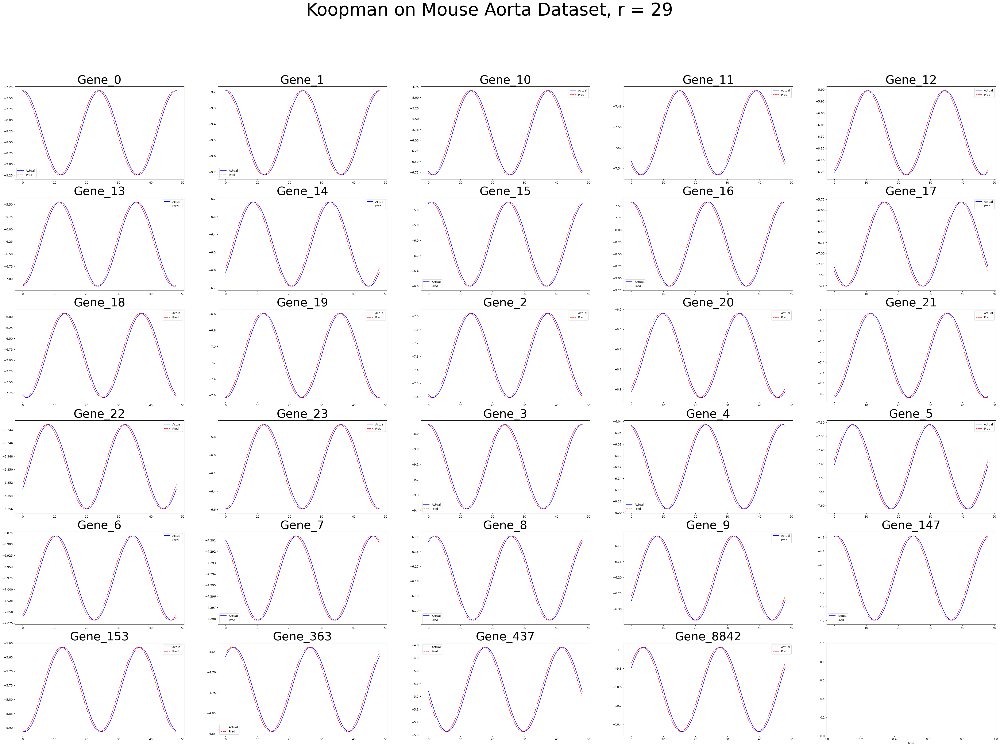

In [ ]:
fig, axs = plt.subplots(6, 5,
                        figsize=(60, 40))

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

gene_cols = tempo_df.iloc[:, 1:].columns.tolist()

for col in range(koopman_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:Xmin],
                 Xkoop_test[:Xmin, col],
                 '-',
                 color='b',
                 label='Actual')
  axs[r, c].plot(time_vec[:Xmin],
                 koopman_pred_df.iloc[:Xmin, :].loc[:, colname].values,
                 '--r',
                 label='Pred')
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)


# Plot
plt.xlabel('time')
suptitle_ncde = 'Koopman on Mouse Aorta Dataset, r = 29'
plt.suptitle(suptitle_ncde, fontsize = 60)
plt.savefig(os.path.join(plots_path, 'dmd_tempo_r29.png'))
plt.show()

In [ ]:
koopman_pred_df.iloc[:Xmin, 0]

,Gene_0
0,-7.338539
1,-7.360411
2,-7.397214
3,-7.448355
4,-7.513012
...,...
95,-7.403702
96,-7.364795
97,-7.340749
98,-7.331950


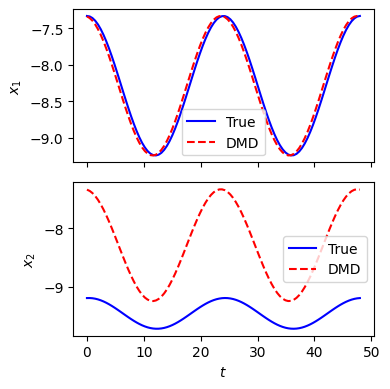

In [ ]:
fig, axs = plt.subplots(2, 1, sharex=True, tight_layout=True, figsize=(4, 4))

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

axs[0].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 0], '-', color='b', label='True')
axs[0].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[0].set(ylabel=r'$x_1$')
axs[1].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 1], '-', color='b', label='True')
axs[1].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[1].set(
        ylabel=r'$x_2$',
        xlabel=r'$t$')
for i in range(2):
    axs[i].legend(loc='best')

## Eigenvectors

In [ ]:
koop_lv_eigenvals = np.log(np.linalg.eig(model_dmd.A)[0])/DT

print(f"koopman eigenvalues = {koop_lv_eigenvals}")

koopman eigenvalues = [ 8.88178420e-16+0.j         -9.05925788e-16+0.12693304j
 -9.05925788e-16-0.12693304j -1.60043987e+00+0.j
 -1.71081261e+00+3.14159265j -1.80616007e+00+2.0962016j
 -1.80616007e+00-2.0962016j  -1.83278660e+00+2.34975961j
 -1.83278660e+00-2.34975961j -1.91257719e+00+0.82053407j
 -1.91257719e+00-0.82053407j -2.19984129e+00+0.14299447j
 -2.19984129e+00-0.14299447j -2.14282416e+00+1.25274024j
 -2.14282416e+00-1.25274024j -2.35936031e+00+1.08725703j
 -2.35936031e+00-1.08725703j -2.48554606e+00+0.83001461j
 -2.48554606e+00-0.83001461j -2.40974713e+00+2.06598678j
 -2.40974713e+00-2.06598678j -2.43602345e+00+3.14159265j
 -2.42374724e+00+2.67908898j -2.42374724e+00-2.67908898j
 -2.80892420e+00+2.55863322j -2.80892420e+00-2.55863322j
 -3.23724401e+00+0.j         -4.88787521e+00+0.j
 -5.67429263e+00+3.14159265j]


In [ ]:
for eigval in model_dmd.continuous_lamda_array:
    print('continuous eigenvalue = ',eigval)


continuous eigenvalue =  (1.8318679906315075e-15+0j)
continuous eigenvalue =  (-1.868471938237779e-15+0.2617993877991504j)
continuous eigenvalue =  (-1.868471938237779e-15-0.2617993877991504j)
continuous eigenvalue =  (-3.3009072351026743+0j)
continuous eigenvalue =  (-3.5285510163620035+6.4795348480289485j)
continuous eigenvalue =  (-3.725205135025589+4.323415793849787j)
continuous eigenvalue =  (-3.725205135025589-4.323415793849787j)
continuous eigenvalue =  (-3.7801223718467307+4.846379205286767j)
continuous eigenvalue =  (-3.7801223718467307-4.846379205286767j)
continuous eigenvalue =  (-3.9446904608568008+1.6923515274202043j)
continuous eigenvalue =  (-3.9446904608568008-1.6923515274202043j)
continuous eigenvalue =  (-4.537172659032187+0.29492608544556737j)
continuous eigenvalue =  (-4.537172659032187-0.29492608544556737j)
continuous eigenvalue =  (-4.41957483446968+2.583776735336959j)
continuous eigenvalue =  (-4.41957483446968-2.583776735336959j)
continuous eigenvalue =  (-4.866

<AxesSubplot:>

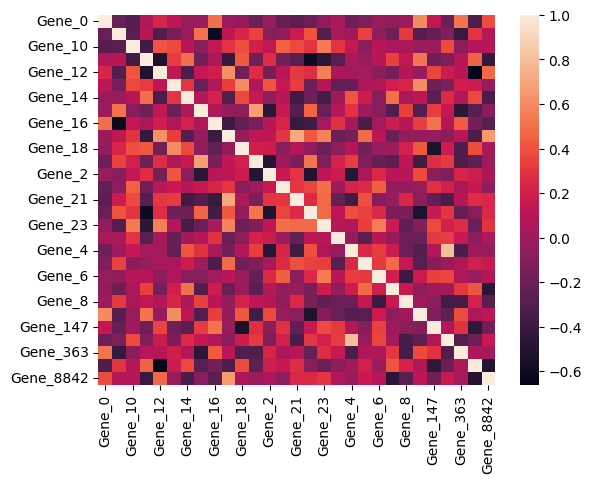

In [ ]:
modes_real_df = pd.DataFrame(model_dmd.W.real)
modes_real_corr = modes_real_df.T.corr()
modes_real_corr.index = tempo_df.iloc[:, 1:].columns.tolist()
modes_real_corr.columns = tempo_df.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_real_corr)

<AxesSubplot:>

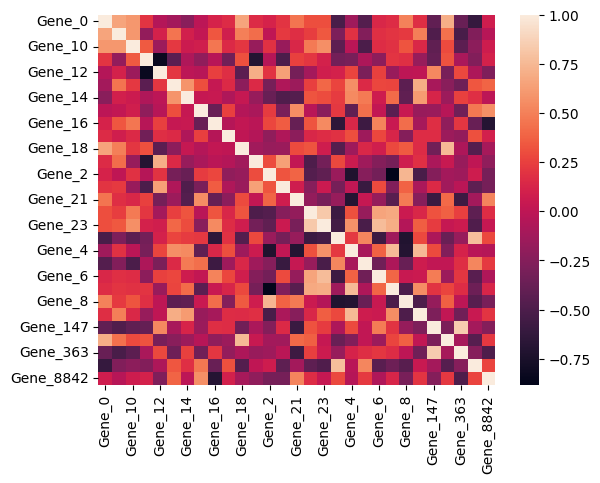

In [ ]:
modes_imag_df = pd.DataFrame(model_dmd.W.imag)
modes_imag_corr = modes_imag_df.T.corr()
modes_imag_corr.index = tempo_df.iloc[:, 1:].columns.tolist()
modes_imag_corr.columns = tempo_df.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_imag_corr)

## Koopman / DMD Performance Metrics

### Pooled MSE

In [ ]:
koopman_pooled_mse = pooled_mse(true_df = tempo_df.iloc[:, 1:], pred_df = koopman_pred_df)

### R2

In [ ]:
koopman_pooled_r2 = r2_score(y_true = tempo_df.iloc[:, 1:], y_pred = koopman_pred_df)

### Summary of Performance Metrics

In [ ]:
print(f"Pooled MSE: {koopman_pooled_mse}")
print(f"R2: {koopman_pooled_r2}")

Pooled MSE: 0.0020879747652251483
R2: 0.9840514724707745


# Bayesian Lotka-Volterra

## Helper Functions

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]
    B = theta[3, :]

    return odeint(func=gLV, y0=X0,
                  t=tempo_df.time,
                  args=(r, AX, B))



def gLV(X, t, r, AX, B):
    return X * (r + AX) + B

## Specify Model

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = tempo_df.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=-5,
                    upper=5,
                    shape=n,
                    initval=tempo_df.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Normal("r",
                  mu=0,
                  sigma=2,
                  shape=n)
    priors.append(r)


    # Params for A
    A = pm.Normal("A",
                  mu=0,
                  sigma=5,
                  shape=(n, n),
                  initval=tempo_df.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Params for linear term B
    B = pm.Normal("B",
                  mu=0,
                  sigma=5,
                  shape=n)
    priors.append(B)

    # Priors
    sigma = pm.HalfNormal("sigma", 2)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=tempo_df.iloc[:, 1:].values)

## Sampling

In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    trace_slice = pm.sample(step=[pm.Metropolis(vars_list)],
                            tune = tune,
                            draws = draws,
                            progressbar = True)

trace = trace_slice
az_trace = az.summary(trace)
az_trace

/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Output()

/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Run terminated (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Run terminated (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


Array contains NaN-value.
/usr/local/lib/python3.11/dist-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/usr/local/lib/python3.11/dist-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/usr/local/lib/python3.11/dist-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4
Array contains NaN-value.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"A[0, 0]",0.467,0.0,0.467,0.467,0.0,NaN,400.0,400.0,NaN
"A[0, 1]",0.128,0.0,0.128,0.128,0.0,0.0,400.0,400.0,NaN
"A[0, 2]",-0.445,0.0,-0.445,-0.445,0.0,0.0,400.0,400.0,NaN
"A[0, 3]",-0.014,0.0,-0.014,-0.014,0.0,0.0,400.0,400.0,NaN
"A[0, 4]",-0.082,0.0,-0.082,-0.082,0.0,0.0,400.0,400.0,NaN
...,...,...,...,...,...,...,...,...,...
r[25],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN
r[26],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN
r[27],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN
r[28],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN


In [ ]:
model.values_to_rvs.keys()

dict_keys([X0_interval__, r, A, B, sigma_log__, TensorConstant(TensorType(float64, shape=(100, 29)), data=array([[-7 ... 8994012]]))])

## Model 2

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]

    return odeint(func=gLV, y0=X0,
                  t=tempo_df.time,
                  args=(r, AX))



def gLV(X, t, r, AX):
    return X * (r + AX)

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = tempo_df.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=-15,
                    upper=0,
                    shape=n,
                    initval=tempo_df.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Uniform("r",
                  lower=-15,
                    upper=0,
                  shape=n, initval=tempo_df.iloc[1, 1:].values)
    priors.append(r)


    # Params for A
    # A = pm.Normal("A",
    #               mu=0,
    #               sigma=5,
    #               shape=(n, n),
    #               initval=dinner_smooth.iloc[:, 1:].cov().values)
    A = pm.Uniform("A", lower = -15, upper = 0, shape = (n, n), initval = tempo_df.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Priors
    sigma = pm.HalfNormal("sigma", 10)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=tempo_df.iloc[:, 1:].values)

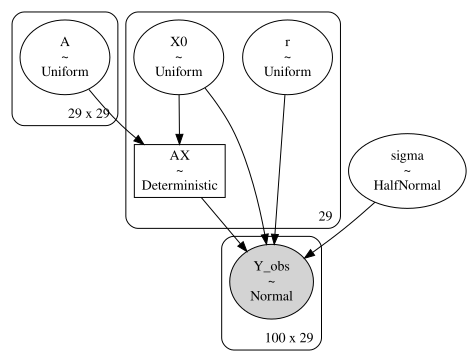

In [ ]:
pm.model_to_graphviz(model=model)


In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    nuts_trace_slice = pm.sample(progressbar = False)

nuts_trace = nuts_trace_slice
az_nuts_trace = az.summary(nuts_trace)
az_nuts_trace

/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/inte

ParallelSamplingError: Chain 1 failed with: Bad initial energy: SamplerWarning(kind=<WarningType.BAD_ENERGY: 8>, message='Bad initial energy, check any log probabilities that are inf or -inf, nan or very small:\n[nan nan]\n.Try model.debug() to identify parametrization problems.', level='critical', step=0, exec_info=None, extra=None, divergence_point_source=None, divergence_point_dest=None, divergence_info=None)

## Evaluate Performance

## Get Posterior Params

In [ ]:
A_mh = az_trace.loc[az_trace['mean'].index.str.startswith('A['), 'mean'].values.reshape((n, n))
X0_mh = az_trace.loc[az_trace['mean'].index.str.startswith('X0'), 'mean'].values
r_mh = az_trace.loc[az_trace['mean'].index.str.startswith('r'), 'mean'].values
B_mh = az_trace.loc[az_trace['mean'].index.str.startswith('B'), 'mean'].values

A_mh_df = pd.DataFrame(A_mh,
                       columns = tempo_df.columns[1:],
                       index = tempo_df.columns[1:])
A_mh_df

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
Gene_0,0.467,0.128,-0.445,-0.014,-0.082,-0.412,-0.076,0.259,0.426,-0.263,...,0.004,-0.042,0.002,0.012,-0.034,0.146,-0.072,0.040,-0.009,0.117
Gene_1,0.128,0.035,-0.126,-0.004,-0.022,-0.112,-0.019,0.073,0.117,-0.080,...,0.002,-0.011,0.000,0.003,-0.008,0.041,-0.020,0.011,-0.006,0.036
Gene_10,-0.445,-0.126,0.495,0.019,0.066,0.376,0.040,-0.275,-0.406,0.404,...,-0.032,0.033,-0.001,-0.014,0.011,-0.149,0.073,-0.050,0.070,-0.184
Gene_11,-0.014,-0.004,0.019,0.001,0.001,0.011,-0.000,-0.010,-0.012,0.020,...,-0.002,0.001,-0.000,-0.001,-0.001,-0.005,0.002,-0.002,0.005,-0.009
Gene_12,-0.082,-0.022,0.066,0.001,0.016,0.075,0.019,-0.041,-0.075,0.020,...,0.004,0.009,-0.000,-0.002,0.010,-0.024,0.012,-0.005,-0.009,-0.008
Gene_13,-0.412,-0.112,0.376,0.011,0.075,0.368,0.075,-0.222,-0.376,0.195,...,0.004,0.039,-0.002,-0.010,0.035,-0.126,0.063,-0.032,-0.007,-0.085
Gene_14,-0.076,-0.019,0.040,-0.000,0.019,0.075,0.028,-0.029,-0.070,-0.029,...,0.013,0.010,-0.000,-0.001,0.016,-0.019,0.010,-0.001,-0.027,0.015
Gene_15,0.259,0.073,-0.275,-0.010,-0.041,-0.222,-0.029,0.155,0.237,-0.207,...,0.013,-0.021,0.001,0.008,-0.011,0.085,-0.042,0.027,-0.029,0.093
Gene_16,0.426,0.117,-0.406,-0.012,-0.075,-0.376,-0.070,0.237,0.389,-0.239,...,0.003,-0.038,0.002,0.011,-0.031,0.133,-0.066,0.036,-0.008,0.106
Gene_17,-0.263,-0.080,0.404,0.020,0.020,0.195,-0.029,-0.207,-0.239,0.482,...,-0.064,0.009,-0.000,-0.013,-0.027,-0.104,0.050,-0.048,0.138,-0.223


In [ ]:
traj_mh = odeint(func=gLV, y0=X0_mh,
                  t=tempo_df.time,
                  args=(r_mh, A_mh @ X0_mh))

bayesian_glv_pred_df = pd.DataFrame(traj_mh, columns = tempo_df.columns[1:])
bayesian_glv_pred_df

/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,-4.291000e+00,NaN,NaN,-4.290000e+00,NaN,-4.654000e+00,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,-4.291000e+00,NaN,NaN,-4.290000e+00,NaN,-4.654000e+00,NaN,NaN
2,1.205199e+21,9.413375e-110,8.564860e+183,8.828937e+199,5.981576e-154,3.016946e+174,9.083668e+223,6.013470e-154,7.095232e-77,4.048680e-317,...,1.199859e+16,4.921127e+257,3.638595e+185,2.654272e+07,3.421279e+180,4.934328e+257,1.947674e+243,4.443877e+252,1.060978e-153,2.676426e+98
3,9.302223e+242,2.468800e-154,3.764387e+199,3.906463e+180,2.434699e-22,9.101611e+276,5.961002e+175,6.013345e-154,6.967642e+252,9.822021e+252,...,2.630347e+35,9.302208e+242,3.938414e+180,4.895606e-109,6.013470e-154,2.863763e+242,2.168544e+243,2.268907e+271,1.123199e+219,1.060838e-153
4,3.638512e+185,9.302142e+242,7.658495e+151,4.373391e+257,1.173675e-90,8.112799e+228,2.445506e-154,5.376250e+241,1.416686e-23,2.469529e-154,...,3.764387e+199,9.302207e+242,3.777103e+233,3.913556e-109,5.960760e+175,9.401609e+77,4.103294e+93,2.584150e+161,1.382075e+267,1.052457e-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2.469529e-154,2.914471e+222,1.281532e-152,6.196352e+223,9.662951e+141,3.788584e-258,1.337170e-152,2.137809e+161,4.007196e-149,9.268130e+199,...,2.782608e+180,2.314636e-152,4.619648e+281,1.719649e+238,1.946732e+227,2.445506e-154,8.564860e+183,3.813883e+180,1.052625e-23,6.013470e-154
96,8.778533e+252,2.208229e-259,6.013470e-154,4.649931e-72,3.788584e-258,1.337170e-152,2.439056e-154,9.336021e+77,8.831336e+25,1.052619e-23,...,2.689134e+98,3.343798e+151,1.120389e+219,1.455543e-94,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,8.308079e+151
97,3.777062e+233,2.181743e+243,5.981493e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,2.654259e+07,7.376453e+97,5.444533e-109,...,7.874881e+276,8.833939e+199,1.489775e+214,1.756310e-152,5.026205e+180,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154
98,2.210193e+68,2.661551e+06,1.395041e-152,1.817862e+185,1.876735e-152,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,...,6.013470e-154,6.013470e-154,5.349391e+59,6.013344e-154,4.710913e+180,5.349391e+59,6.013347e-154,4.771665e+180,1.062639e+248,2.445506e-154


## Recreate Trajectories & Compare (Plot Predictions)

<ipython-input-103-8bdbcecbbb44>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'bglv_tempo_traj_noraml.png'))
<ipython-input-103-8bdbcecbbb44>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'bglv_tempo_traj_noraml.png'))
<ipython-input-103-8bdbcecbbb44>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'bglv_tempo_traj_noraml.png'))
<ipython-input-103-8bdbcecbbb44>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supporte

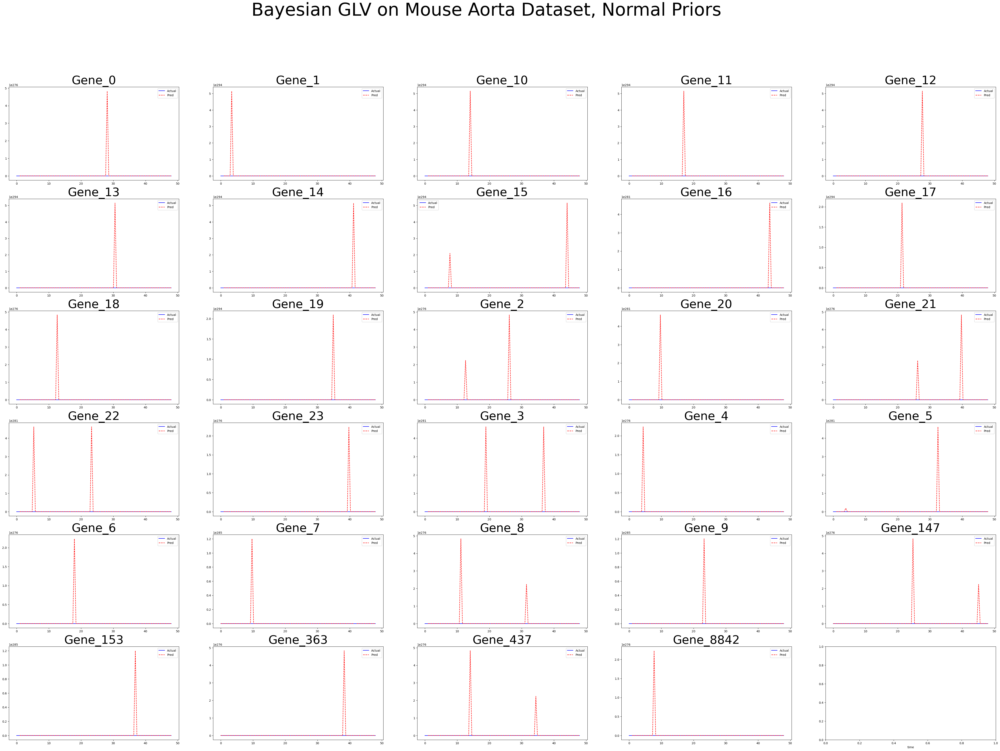

In [ ]:
fig, axs = plt.subplots(6, 5,
                        figsize=(60, 40))

gene_cols = tempo_df.iloc[:, 1:].columns.tolist()
time_vec_mh = tempo_df['time'].values

for col in range(bayesian_glv_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  tempo_df.loc[:, colname].values

  axs[r, c].plot(time_vec_mh,
                 tempo_df.loc[:, colname].values,
                 '-',
                 color='b',
                 label='Actual')
  axs[r, c].plot(time_vec_mh,
                 bayesian_glv_pred_df.loc[:, colname].values,
                 '--r',
                 label='Pred')
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)


# Plot
plt.xlabel('time')
suptitle_bglv = 'Bayesian GLV on Mouse Aorta Dataset, Normal Priors'
plt.suptitle(suptitle_bglv, fontsize = 60)
plt.savefig(os.path.join(plots_path, 'bglv_tempo_traj_noraml.png'))
plt.show()

## Interaction Matrix Posterior Heatmap

<ipython-input-104-32bc1aab7e66>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "bayes_glv_tempo_normal.png"))
<ipython-input-104-32bc1aab7e66>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "bayes_glv_tempo_normal.png"))
<ipython-input-104-32bc1aab7e66>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "bayes_glv_tempo_normal.png"))
<ipython-input-104-32bc1aab7e66>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as

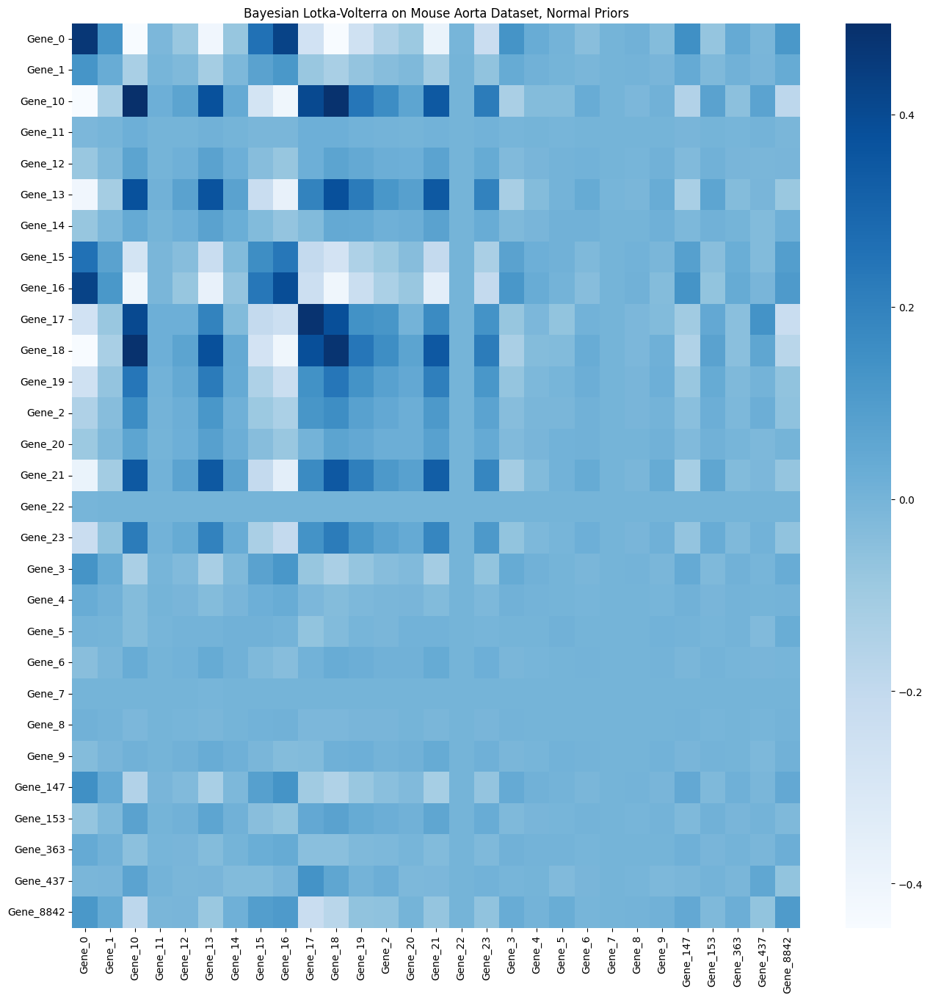

In [ ]:

plt.figure(figsize=(16,16))
sns.heatmap(A_mh_df, cmap = 'Blues', xticklabels=True, yticklabels=True)
plt.title('Bayesian Lotka-Volterra on Mouse Aorta Dataset, Normal Priors')
plt.savefig(os.path.join(plots_path, "bayes_glv_tempo_normal.png"))


### Interaction Matrix Prior - Gene Covariance Matrix Heatmap

To benchmark how much $A$ changes in the posterior

<AxesSubplot:>

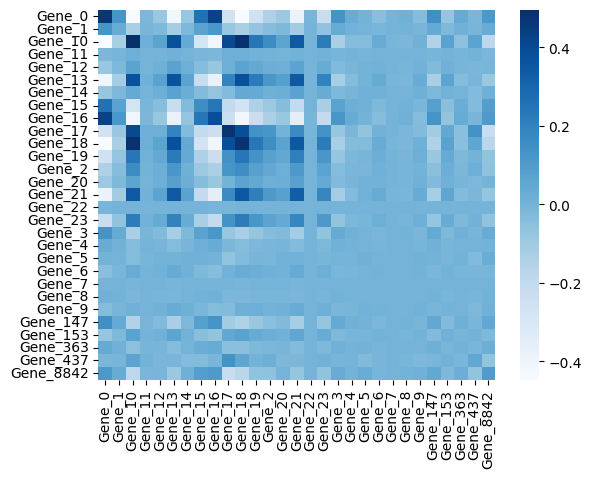

In [ ]:

sns.heatmap(tempo_df.iloc[:, 1:].cov(),
            cmap = 'Blues',
            xticklabels=True,
            yticklabels=True)


## Performance Metrics

### Pooled MSE

In [ ]:
bayes_glv_pooled_mse = pooled_mse(true_df = tempo_df.iloc[:, 1:], pred_df = bayesian_glv_pred_df)

### R2

In [ ]:
notnull_idx = bayesian_glv_pred_df.index[bayesian_glv_pred_df.isnull().sum(axis=1) == 0]

,time,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
98,36.5,0.110,0.146,0.235,0.153,0.184,0.236,0.167,0.284,0.365,...,-0.394,-0.284,-0.287,-0.404,0.153,0.105,0.312,0.292,0.175,0.296
100,37.0,0.052,0.115,0.167,0.108,0.127,0.176,0.052,0.164,0.284,...,-0.272,-0.165,-0.164,-0.297,0.058,0.010,0.265,0.238,0.120,0.210
102,37.5,0.001,0.087,0.103,0.067,0.076,0.123,-0.049,0.056,0.210,...,-0.160,-0.056,-0.051,-0.198,-0.024,-0.074,0.216,0.185,0.070,0.132
104,38.0,-0.043,0.062,0.045,0.029,0.030,0.076,-0.140,-0.038,0.142,...,-0.059,0.042,0.050,-0.108,-0.096,-0.149,0.167,0.132,0.027,0.063
106,38.5,-0.082,0.040,-0.008,-0.004,-0.009,0.035,-0.220,-0.121,0.080,...,0.032,0.131,0.142,-0.025,-0.159,-0.215,0.119,0.080,-0.010,0.002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,98.0,0.083,0.802,0.255,0.204,0.243,0.278,0.181,0.435,0.497,...,-0.357,-0.234,-0.383,-0.234,-0.048,-0.165,0.510,0.353,0.229,0.173
346,98.5,0.055,0.775,0.230,0.158,0.204,0.256,0.124,0.363,0.437,...,-0.299,-0.212,-0.317,-0.167,-0.071,-0.175,0.538,0.373,0.212,0.158
348,99.0,0.021,0.745,0.201,0.101,0.158,0.228,0.054,0.274,0.362,...,-0.224,-0.178,-0.234,-0.082,-0.095,-0.184,0.561,0.389,0.186,0.135
350,99.5,-0.017,0.709,0.165,0.034,0.104,0.194,-0.028,0.167,0.270,...,-0.130,-0.132,-0.132,0.022,-0.121,-0.192,0.581,0.401,0.150,0.103


In [ ]:
bayesian_glv_pred_df.iloc[notnull_idx]

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
2,1.205199e+21,9.413375e-110,8.564860e+183,8.828937e+199,5.981576e-154,3.016946e+174,9.083668e+223,6.013470e-154,7.095232e-77,4.048680e-317,...,1.199859e+16,4.921127e+257,3.638595e+185,2.654272e+07,3.421279e+180,4.934328e+257,1.947674e+243,4.443877e+252,1.060978e-153,2.676426e+98
3,9.302223e+242,2.468800e-154,3.764387e+199,3.906463e+180,2.434699e-22,9.101611e+276,5.961002e+175,6.013345e-154,6.967642e+252,9.822021e+252,...,2.630347e+35,9.302208e+242,3.938414e+180,4.895606e-109,6.013470e-154,2.863763e+242,2.168544e+243,2.268907e+271,1.123199e+219,1.060838e-153
4,3.638512e+185,9.302142e+242,7.658495e+151,4.373391e+257,1.173675e-90,8.112799e+228,2.445506e-154,5.376250e+241,1.416686e-23,2.469529e-154,...,3.764387e+199,9.302207e+242,3.777103e+233,3.913556e-109,5.960760e+175,9.401609e+77,4.103294e+93,2.584150e+161,1.382075e+267,1.052457e-23
5,2.135216e+185,2.593386e+161,3.633184e+198,3.042123e-14,9.483763e-154,6.013470e-154,6.038218e+151,7.358764e+223,3.186615e+151,1.949309e+243,...,2.445517e-154,5.981299e-154,1.379452e+219,1.382013e+267,9.296031e+199,1.219061e-152,2.523000e-258,3.813883e+180,2.922268e-14,7.337324e+223
6,1.173306e+214,2.974678e+228,4.619647e+281,8.327238e+151,2.208138e-259,8.828937e+199,4.360446e+222,2.869818e-104,9.487297e+170,2.441411e-152,...,2.233207e+276,9.542197e+179,2.208136e-259,6.013470e-154,1.120394e+219,5.171129e-109,6.013470e-154,5.330482e+246,1.052619e-23,6.013470e-154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2.469529e-154,2.914471e+222,1.281532e-152,6.196352e+223,9.662951e+141,3.788584e-258,1.337170e-152,2.137809e+161,4.007196e-149,9.268130e+199,...,2.782608e+180,2.314636e-152,4.619648e+281,1.719649e+238,1.946732e+227,2.445506e-154,8.564860e+183,3.813883e+180,1.052625e-23,6.013470e-154
96,8.778533e+252,2.208229e-259,6.013470e-154,4.649931e-72,3.788584e-258,1.337170e-152,2.439056e-154,9.336021e+77,8.831336e+25,1.052619e-23,...,2.689134e+98,3.343798e+151,1.120389e+219,1.455543e-94,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,8.308079e+151
97,3.777062e+233,2.181743e+243,5.981493e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,2.654259e+07,7.376453e+97,5.444533e-109,...,7.874881e+276,8.833939e+199,1.489775e+214,1.756310e-152,5.026205e+180,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154
98,2.210193e+68,2.661551e+06,1.395041e-152,1.817862e+185,1.876735e-152,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,...,6.013470e-154,6.013470e-154,5.349391e+59,6.013344e-154,4.710913e+180,5.349391e+59,6.013347e-154,4.771665e+180,1.062639e+248,2.445506e-154


In [ ]:
bayes_glv_r2 = r2_score(y_true = tempo_df.iloc[notnull_idx, 1:] // 10000, y_pred = bayesian_glv_pred_df.iloc[notnull_idx] // 10000)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_regression.py:927: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)


### Summary of Performance Metrics

# Summary Results Across Methods

In [ ]:
mogptk_preds_df

,time,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
0,35.0,0.284017,0.106607,0.242884,0.203670,0.273283,0.294258,0.282169,0.470273,0.575232,...,-0.561344,-0.487192,-0.408874,-0.579115,0.245740,0.203049,0.456692,0.423302,0.434193,0.529899
1,35.5,0.262338,0.105044,0.231633,0.195321,0.263563,0.273342,0.250521,0.440178,0.549824,...,-0.497093,-0.430571,-0.348719,-0.516352,0.222777,0.171752,0.466792,0.444137,0.400712,0.496651
2,36.0,0.231216,0.100773,0.210335,0.179579,0.244095,0.245120,0.203153,0.394437,0.508203,...,-0.424998,-0.363923,-0.280009,-0.445945,0.187300,0.130025,0.461156,0.450895,0.357149,0.450660
3,36.5,0.192156,0.094353,0.179956,0.157163,0.216136,0.211035,0.142406,0.335154,0.452609,...,-0.346556,-0.288929,-0.204089,-0.369172,0.141044,0.079051,0.440722,0.443638,0.305637,0.393943
4,37.0,0.147070,0.086523,0.141838,0.129068,0.181452,0.172741,0.071238,0.264928,0.385869,...,-0.263395,-0.207546,-0.122609,-0.287465,0.086489,0.020503,0.407022,0.422941,0.248566,0.328918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,98.0,0.107719,0.924527,0.326500,0.225221,0.307563,0.299077,0.220068,0.433474,0.514418,...,-0.580265,-0.436132,-0.574619,-0.473510,0.053857,0.072703,0.532769,0.350186,0.135685,0.077252
127,98.5,0.069466,0.923180,0.293048,0.197909,0.284727,0.273384,0.167727,0.383392,0.466574,...,-0.539969,-0.412004,-0.526004,-0.427937,0.017767,0.048508,0.486591,0.327188,0.083471,0.016885
128,99.0,0.032899,0.921359,0.256133,0.167454,0.261091,0.245359,0.109143,0.325797,0.412157,...,-0.490585,-0.378919,-0.469235,-0.371562,-0.020995,0.020939,0.431915,0.301012,0.029119,-0.047153
129,99.5,-0.000485,0.919339,0.216968,0.134706,0.238075,0.216003,0.046894,0.262257,0.353238,...,-0.433270,-0.337172,-0.405419,-0.305305,-0.060830,-0.009236,0.370643,0.272089,-0.025291,-0.112664


In [ ]:
ncde_pred_df

,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,KaiB-4,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
0,0.243911,0.034572,0.230330,-0.092323,0.140155,0.200497,-0.161273,0.043230,-0.109883,0.028384,...,-0.021504,0.077883,-0.188210,-0.150156,-0.290748,-0.092328,0.086799,0.004932,-0.015314,-0.047664
1,0.218839,-0.024361,0.204696,-0.096112,0.128613,0.200778,-0.157130,-0.045453,-0.099033,-0.024411,...,-0.018165,0.089371,-0.217972,-0.081019,-0.300983,-0.070257,0.068573,-0.041419,-0.058676,0.016456
2,0.196403,-0.073298,0.182332,-0.096849,0.119303,0.200973,-0.158192,-0.122883,-0.087950,-0.069265,...,-0.013541,0.098800,-0.243858,-0.021726,-0.311049,-0.050714,0.054331,-0.083187,-0.097247,0.073158
3,0.174918,-0.118316,0.162630,-0.097247,0.110705,0.201101,-0.161380,-0.193177,-0.077180,-0.109214,...,-0.008911,0.106909,-0.266488,0.032663,-0.319674,-0.032375,0.041632,-0.121294,-0.131129,0.125560
4,0.154515,-0.156368,0.145013,-0.096863,0.103039,0.201420,-0.166180,-0.256103,-0.067960,-0.146047,...,-0.003991,0.115182,-0.287036,0.080986,-0.328734,-0.017060,0.031560,-0.156250,-0.160005,0.172555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,0.348941,0.547096,0.420132,-0.323163,0.087486,0.188501,-0.086200,0.316616,0.442108,0.518230,...,0.076006,-0.114374,-0.237174,-0.095284,-0.119687,0.184819,0.060936,0.140170,0.253583,-0.313964
126,0.335351,0.534160,0.410749,-0.332455,0.079227,0.194263,-0.074197,0.285471,0.438245,0.499795,...,0.069846,-0.111447,-0.245650,-0.081939,-0.123205,0.192609,0.053807,0.127118,0.244232,-0.306147
127,0.315261,0.516189,0.395835,-0.342009,0.068490,0.204920,-0.063162,0.242566,0.427839,0.467303,...,0.062337,-0.104264,-0.256127,-0.066063,-0.129765,0.200114,0.046897,0.107087,0.231195,-0.293543
128,0.290778,0.495005,0.378015,-0.352486,0.054492,0.217773,-0.051195,0.193220,0.414678,0.427024,...,0.055157,-0.095037,-0.268418,-0.047675,-0.137696,0.207563,0.040083,0.083288,0.216271,-0.277147


In [ ]:
koopman_pred_df

,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,KaiB-4,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
0,0.253638,0.215454,0.386948,0.271986,0.312806,0.376512,0.447593,0.585076,0.560678,0.726678,...,-0.675164,-0.563228,-0.593740,-0.642896,0.377400,0.332586,0.418756,0.413267,0.302519,0.508405
1,0.184088,0.182161,0.311829,0.221848,0.247486,0.306204,0.315655,0.444217,0.477887,0.590972,...,-0.544672,-0.431004,-0.456649,-0.535493,0.261141,0.217530,0.382951,0.368393,0.244805,0.407901
2,0.122941,0.152327,0.242733,0.173218,0.188110,0.241268,0.193221,0.316990,0.396020,0.465210,...,-0.421472,-0.306954,-0.324574,-0.430412,0.156560,0.109331,0.340371,0.320509,0.191671,0.314324
3,0.069370,0.124766,0.176203,0.129359,0.133498,0.182991,0.081441,0.200320,0.316913,0.348574,...,-0.305031,-0.192284,-0.201345,-0.329543,0.063530,0.010257,0.291239,0.268472,0.141351,0.227815
4,0.021091,0.099524,0.112171,0.088609,0.083255,0.130355,-0.020039,0.094743,0.240816,0.240017,...,-0.196441,-0.086333,-0.086507,-0.231951,-0.019669,-0.079772,0.238152,0.213068,0.093848,0.148023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,0.063322,0.596569,0.141867,-1.286557,-0.238220,-0.134268,-1.114615,-1.836620,-1.508255,-1.981506,...,2.206832,1.596202,1.913192,2.151808,0.648176,1.020215,-0.666904,-0.764217,-1.376306,-1.201985
127,0.089936,0.624947,0.176902,-1.285651,-0.213800,-0.120468,-1.085705,-1.827316,-1.500399,-1.960797,...,2.210707,1.604250,1.899030,2.149057,0.688587,1.065934,-0.712526,-0.800466,-1.414022,-1.229555
128,0.116712,0.654446,0.212553,-1.278187,-0.187649,-0.105241,-1.050740,-1.808703,-1.484461,-1.928925,...,2.204819,1.606108,1.875362,2.137166,0.726258,1.107359,-0.757055,-0.835806,-1.446411,-1.252663
129,0.143569,0.684947,0.248680,-1.263970,-0.159837,-0.088555,-1.009628,-1.780415,-1.460135,-1.885554,...,2.188697,1.601339,1.841831,2.115743,0.760922,1.144160,-0.799916,-0.869778,-1.472880,-1.270773


In [ ]:
bayesian_glv_pred_df

,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,KaiB-4,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
0,2.460000e-01,2.200000e-01,3.850000e-01,2.560000e-01,3.150000e-01,3.750000e-01,4.350000e-01,5.650000e-01,5.450000e-01,7.120000e-01,...,NaN,NaN,NaN,NaN,3.770000e-01,3.270000e-01,4.050000e-01,3.980000e-01,3.030000e-01,4.960000e-01
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.132952e+233,1.473450e+195,6.013470e-154,2.294624e+161,4.554884e-08,6.013470e-154,9.142930e+06,2.210173e+136,4.370823e-19,1.066539e-90,...,1.029416e-71,1.811501e-152,8.007516e+175,3.714576e-81,6.013915e-154,2.624739e-76,7.987590e+175,6.013470e-154,1.303563e-76,2.209037e+136
4,4.370823e-19,1.570764e-76,1.811501e-152,8.007516e+175,3.718695e-81,6.013915e-154,2.624739e-76,7.987590e+175,6.013470e-154,1.303563e-76,...,1.312094e-18,6.127435e-154,3.809862e-08,3.716642e-81,6.013915e-154,2.624739e-76,7.987590e+175,6.013470e-154,1.303563e-76,2.209037e+136
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,4.527640e+202,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.453042e-125,0.000000e+00,0.000000e+00,1.060998e-313,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.428736e-101,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
127,1.949063e+289,0.000000e+00,0.000000e+00,6.365987e-314,0.000000e+00,0.000000e+00,3.607393e-313,0.000000e+00,0.000000e+00,3.683254e-309,...,0.000000e+00,0.000000e+00,0.000000e+00,5.617526e-321,1.020425e-314,1.019709e-314,0.000000e+00,0.000000e+00,NaN,7.579147e+218
128,NaN,9.606748e-37,NaN,1.832402e-94,NaN,1.013493e-70,NaN,8.772848e-95,NaN,1.215190e-71,...,NaN,6.239524e+228,NaN,9.524917e-95,NaN,2.648349e+180,NaN,7.530972e+252,NaN,1.015664e-100
129,NaN,2.208443e-70,NaN,1.014126e-100,NaN,9.541523e-96,NaN,1.382110e-94,NaN,4.062517e+198,...,NaN,4.233563e+175,NaN,1.144226e+243,NaN,1.718719e+161,NaN,1.340256e+248,NaN,8.547620e-72


In [ ]:
time_vec[:-1]

array([35. , 35.5, 36. , 36.5, 37. , 37.5, 38. , 38.5, 39. , 39.5, 40. ,
       40.5, 41. , 41.5, 42. , 42.5, 43. , 43.5, 44. , 44.5, 45. , 45.5,
       46. , 46.5, 47. , 47.5, 48. , 48.5, 49. , 49.5, 50. , 50.5, 51. ,
       51.5, 52. , 52.5, 53. , 53.5, 54. , 54.5, 55. , 55.5, 56. , 56.5,
       57. , 57.5, 58. , 58.5, 59. , 59.5, 60. , 60.5, 61. , 61.5, 62. ,
       62.5, 63. , 63.5, 64. , 64.5, 65. , 65.5, 66. , 66.5, 67. , 67.5,
       68. , 68.5, 69. , 69.5, 70. , 70.5, 71. , 71.5, 72. , 72.5, 73. ,
       73.5, 74. , 74.5, 75. , 75.5, 76. , 76.5, 77. , 77.5, 78. , 78.5,
       79. , 79.5, 80. , 80.5, 81. , 81.5, 82. , 82.5, 83. , 83.5, 84. ,
       84.5, 85. , 85.5, 86. , 86.5, 87. , 87.5, 88. , 88.5, 89. , 89.5,
       90. , 90.5, 91. , 91.5, 92. , 92.5, 93. , 93.5, 94. , 94.5, 95. ,
       95.5, 96. , 96.5, 97. , 97.5, 98. , 98.5, 99. , 99.5])

<ipython-input-111-655860ca2c95>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'tempo_all.png'))
<ipython-input-111-655860ca2c95>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'tempo_all.png'))
<ipython-input-111-655860ca2c95>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'tempo_all.png'))
<ipython-input-111-655860ca2c95>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.3 and will become an error tw

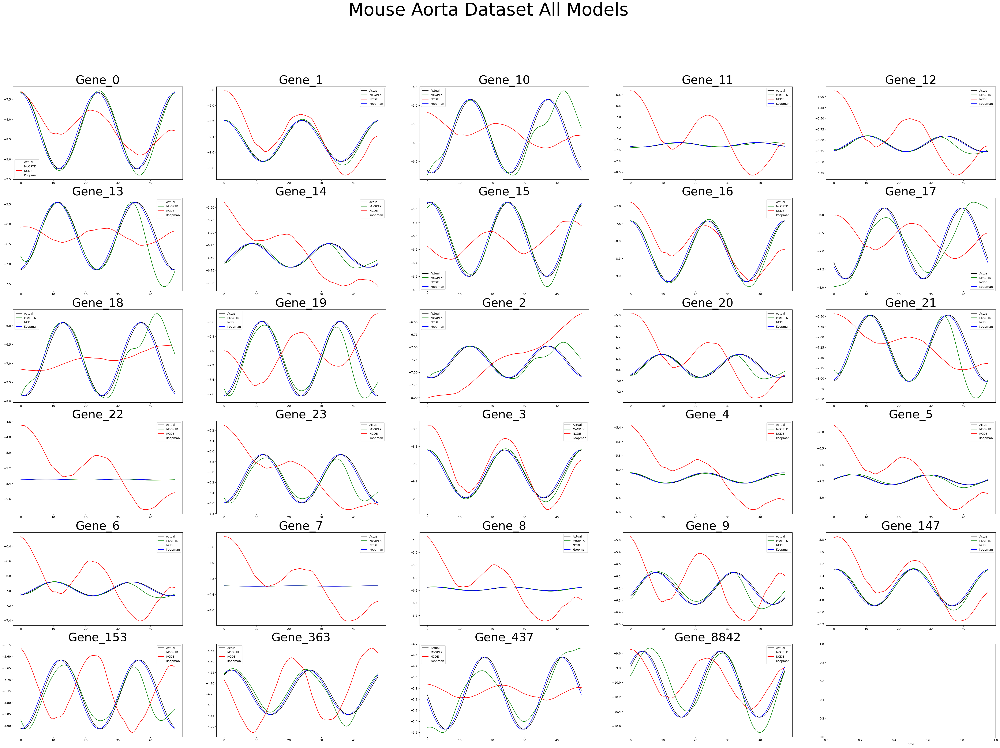

In [ ]:
fig, axs = plt.subplots(6, 5, figsize = (60, 40))

gene_cols = tempo_df.iloc[:, 1:].columns.tolist()

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:-1],
                 tempo_df.iloc[:-1, :].loc[:, colname].values,
                 '-',
                 color='0',
                 label='Actual')

  axs[r, c].plot(time_vec[:-1],
                 mogptk_preds_df.iloc[:-1, :].loc[:, colname].values,
                 'g',
                 label='MoGPTK')

  axs[r, c].plot(time_vec[:-1],
                ncde_pred_df.loc[:, colname].values,
                label = 'NCDE',
                color='r')

  axs[r, c].plot(time_vec[:-1],
                 koopman_pred_df.iloc[:-1, :].loc[:, colname].values,
                 label='Koopman',
                 color='b')

  # axs[r, c].plot(time_vec[:-1],
  #                bayesian_glv_pred_df.iloc[:-1, :].loc[:, colname].values,
  #                label='Bayes GLV',
  #                color='c')
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)

plt.xlabel('time')
suptitle_all = 'Mouse Aorta Dataset All Models'
plt.suptitle(suptitle_all, fontsize = 60)
plt.savefig(os.path.join(plots_path, 'tempo_all.png'))
plt.show()

# Appendix

## NCDE Trial Runs

### NCDE Run: 4/13/2025 6:35 PM, 500 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.550537109375, Accuracy: 3595.550537109375, Computation time: 21.925617933273315
Step: 1, Loss: 3555.825927734375, Accuracy: 3555.825927734375, Computation time: 1.09849214553833
Step: 2, Loss: 3507.551025390625, Accuracy: 3507.551025390625, Computation time: 1.6345157623291016
Step: 3, Loss: 3487.687255859375, Accuracy: 3487.687255859375, Computation time: 0.76163649559021
Step: 4, Loss: 3472.209228515625, Accuracy: 3472.209228515625, Computation time: 0.6960725784301758
Step: 5, Loss: 3440.94921875, Accuracy: 3440.94921875, Computation time: 0.8357787132263184
Step: 6, Loss: 3413.404296875, Accuracy: 3413.404296875, Computation time: 0.8866899013519287
Step: 7, Loss: 3391.3505859375, Accuracy: 3391.3505859375, Computation time: 1.196861982345581
Step: 8, Loss: 3376.815917

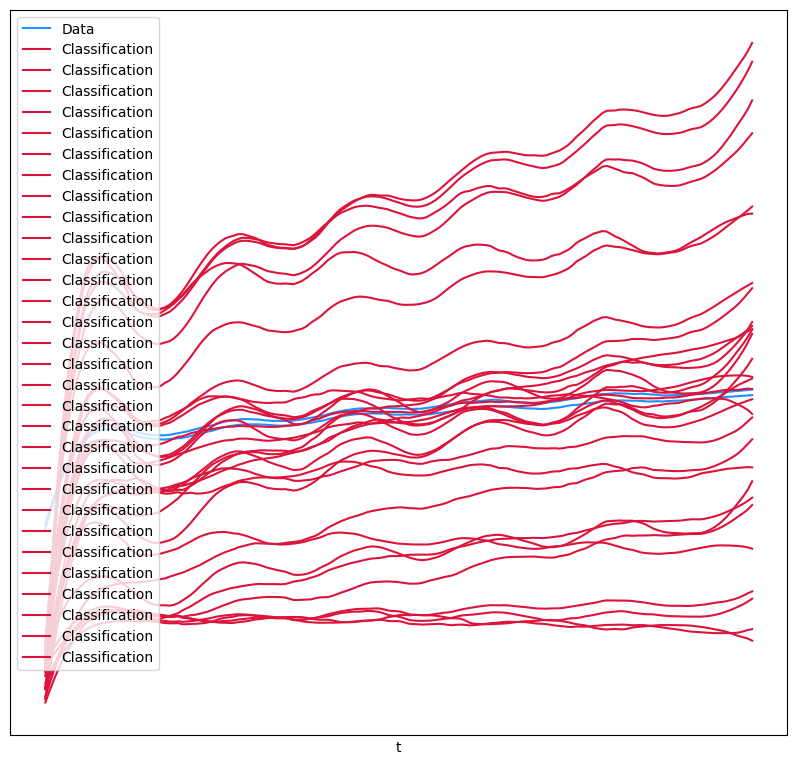

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:25PM, 200 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.26220703125, Accuracy: 3595.26220703125, Computation time: 26.537452697753906
Step: 1, Loss: 3555.12841796875, Accuracy: 3555.12841796875, Computation time: 0.9068377017974854
Step: 2, Loss: 3507.05810546875, Accuracy: 3507.05810546875, Computation time: 0.8603711128234863
Step: 3, Loss: 3488.76220703125, Accuracy: 3488.76220703125, Computation time: 0.7739553451538086
Step: 4, Loss: 3471.976318359375, Accuracy: 3471.976318359375, Computation time: 0.7465741634368896
Step: 5, Loss: 3441.75390625, Accuracy: 3441.75390625, Computation time: 0.8720881938934326
Step: 6, Loss: 3413.742919921875, Accuracy: 3413.742919921875, Computation time: 1.4321730136871338
Step: 7, Loss: 3391.753662109375, Accuracy: 3391.753662109375, Computation time: 2.754321813583374
Step: 8, Loss: 3376.

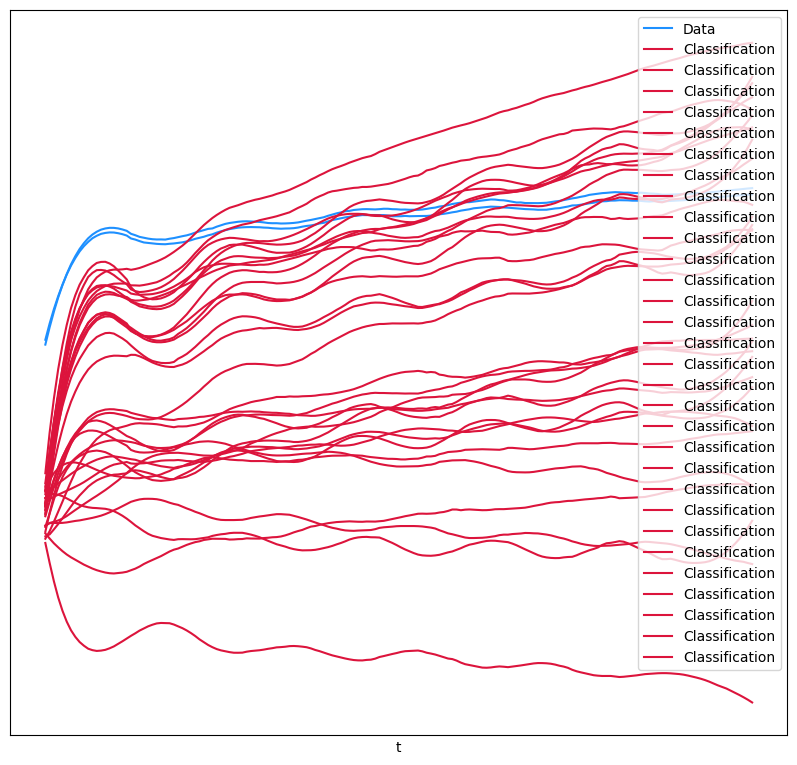

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:00PM, 100 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.312744140625, Accuracy: 3595.312744140625, Computation time: 19.95695424079895
Step: 1, Loss: 3555.794921875, Accuracy: 3555.794921875, Computation time: 1.4375996589660645
Step: 2, Loss: 3506.536376953125, Accuracy: 3506.536376953125, Computation time: 1.3460593223571777
Step: 3, Loss: 3487.83447265625, Accuracy: 3487.83447265625, Computation time: 1.1185424327850342
Step: 4, Loss: 3472.236083984375, Accuracy: 3472.236083984375, Computation time: 0.6792178153991699
Step: 5, Loss: 3441.907470703125, Accuracy: 3441.907470703125, Computation time: 0.7658653259277344
Step: 6, Loss: 3413.754150390625, Accuracy: 3413.754150390625, Computation time: 0.8729970455169678
Step: 7, Loss: 3391.171630859375, Accuracy: 3391.171630859375, Computation time: 1.066856861114502
Step: 8, Loss: 3376.109130859375, Accuracy: 3

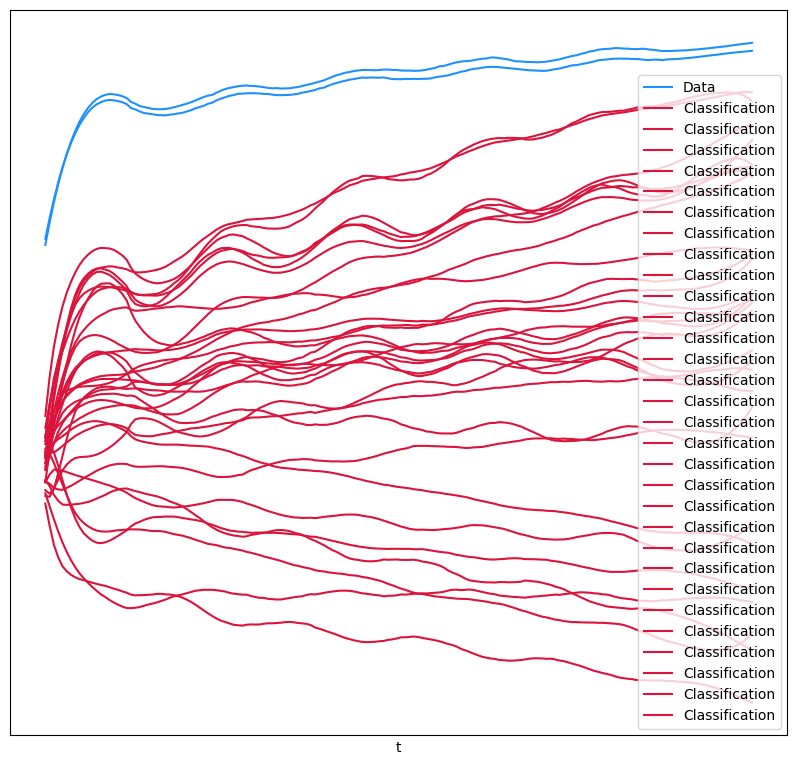

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

## Train-test split